# Clasificación de defectos en placas PCB — 4 pipelines comparadas

## Planteamiento del problema

Una placa de circuito impreso (PCB) defectuosa que llega a producción puede provocar
fallas de campo costosas. La inspección visual manual es lenta, subjetiva y no escala
con los volúmenes de manufactura electrónica actuales, por lo que hay un fuerte interés
industrial en la **inspección óptica automática (AOI)** basada en visión por computador.

Este notebook aborda la clasificación de **6 tipos de defectos** en placas PCB usando el
dataset público **PKU-Market-PCB** (Kaggle: `akhatova/pcb-defects`), y compara
**cuatro enfoques de clasificación**, ordenados de más manual/interpretable a más
automático/profundo:

1. **Pipeline 1 — Manual + ML clásico**: descriptores hechos a mano (HOG + LBP + geometría)
   clasificados con SVM y Random Forest.
2. **Pipeline 2 — Manual + Red Neuronal**: las mismas características, clasificadas con un MLP.
3. **Pipeline 3 — DL + ML clásico**: una ResNet50 preentrenada y congelada actúa solo como
   extractor de características, clasificadas con SVM y Random Forest.
4. **Pipeline 4 — DL end-to-end**: una ResNet50 congelada con una cabeza densa entrenable,
   clasificando directamente desde los píxeles.

El objetivo no es solo obtener el mejor modelo, sino **entender por qué** un enfoque
supera a otro en este dominio particular — que resulta tener una física muy distinta a
las imágenes naturales para las que ResNet50 fue diseñada.

## Los 6 tipos de defecto

| Clase | Nombre | Descripción física |
|---|---|---|
| `missing_hole` | Orificio faltante | Falta un taladro/vía donde el diseño especifica uno; impide el montaje de un componente pasante o la conexión entre capas. Es un defecto de **ausencia de material**, geométricamente muy distintivo (un agujero circular que debería estar y no está). |
| `mouse_bite` | Mordedura de ratón | Pequeñas muescas semicirculares en el borde de una pista de cobre, como si hubiera sido mordisqueada. Reduce la sección conductora y, en casos severos, puede llegar a interrumpirla. |
| `open_circuit` | Circuito abierto | Una pista de cobre queda interrumpida en algún punto, dejando dos extremos aislados sin continuidad eléctrica. Es un defecto de **discontinuidad**. |
| `short` | Cortocircuito | Un puente de cobre no deseado conecta dos pistas que deberían estar aisladas entre sí, creando una conexión eléctrica indebida. Es el opuesto físico de `open_circuit`. |
| `spur` | Espuela | Un pequeño apéndice de cobre que sobresale de una pista sin conectar con nada más: resto de cobre "colgando" del grabado. Es sutil porque puede confundirse con una pista legítima vista parcialmente. |
| `spurious_copper` | Cobre espurio | Una isla de cobre aislada del resto del circuito, resultado de un error de grabado (etching) que dejó cobre donde no debía quedar ninguno. |

## Por qué clasificación por parches (y no de la placa completa)

Cada placa completa mide del orden de **3000×2500 px**, mientras que cada defecto anotado
mide apenas **~60×65 px** — alrededor de **0.07% del área** de la imagen. Además, el
dataset reutiliza un número limitado de **plantillas de placa** (el mismo diseño de PCB
aparece repetido con distintos defectos inyectados), y varias clases comparten plantilla.

Si se entrenara un clasificador sobre la placa completa, la red tiene un atajo mucho más
fácil que aprender a "ver" el defecto: **memorizar el diseño de la placa** y asociarlo a
la clase que más veces vio con ese diseño. Esto es un caso clásico de *shortcut learning*:
el modelo generalizaría pésimo a placas nuevas porque en realidad no aprendió la textura
o geometría del defecto, sino el layout de cobre de fondo.

La solución adoptada es la **clasificación por parches**: usando las anotaciones
Pascal VOC (XML) que acompañan al dataset, se recorta una ventana cuadrada centrada en
cada defecto, con un margen de **1.8×** su lado mayor (para incluir contexto de cobre/
sustrato alrededor sin diluir demasiado la señal). Esto genera **2953 parches** a partir
de **693 placas**, cada uno con el defecto claramente visible y sin toda la plantilla de
fondo que permitiría memorizar el diseño.

## Por qué el split se agrupa por placa

Cada placa aporta entre 3 y 5 parches (varios defectos anotados sobre la misma placa
física). Un split aleatorio a nivel de *parche* dejaría parches de la **misma placa** en
train y en test simultáneamente — el modelo vería fragmentos de una placa en
entrenamiento y otros fragmentos de esa misma placa en evaluación, lo que constituye
**fuga de datos** (data leakage): el rendimiento en test estaría inflado porque el
modelo ya conoce esa plantilla específica.

Por eso el split usa `GroupShuffleSplit` **agrupando por placa** (`groups='placa'`), de
forma que todos los parches de una placa dada caen enteramente en un solo conjunto.
Resultado: **2078 train / 433 val / 442 test**, con las particiones verificadas para que
ninguna placa aparezca en más de un conjunto.


## Configuración del entorno de ejecución (local, Windows + RTX 4060)

Este notebook fue escrito originalmente para Google Colab y ahora se ejecuta
**localmente en Windows** sobre una **NVIDIA GeForce RTX 4060 (8 GB de VRAM)**. Antes de
tocar cualquier dato, verificamos que TensorFlow efectivamente detecta la GPU y
configuramos el crecimiento incremental de memoria.

**Por qué `set_memory_growth`**: por defecto, TensorFlow reserva de una sola vez casi
toda la VRAM disponible en cuanto se crea la primera sesión, incluso si el modelo
necesita solo una fracción. En una GPU de 8 GB compartida con el sistema operativo
(escritorio, navegador, etc.), esto puede dejar sin memoria a otros procesos o incluso
fallar al iniciar. `tf.config.experimental.set_memory_growth(gpu, True)` hace que
TensorFlow reserve memoria progresivamente, según la va necesitando, lo cual es la
configuración recomendada para GPUs de consumo con VRAM limitada. Esta llamada debe
hacerse **antes** de cualquier operación que inicialice el contexto de la GPU (por eso
va en la primera celda).

**Nota sobre TensorFlow + GPU en Windows nativo**: las versiones de TensorFlow
posteriores a la 2.10 dejaron de dar soporte nativo a GPU en Windows (solo Linux/WSL2).
Si al ejecutar esta celda en Windows la lista de GPUs aparece vacía, las dos rutas
soportadas son: (a) instalar `tensorflow==2.10` junto con CUDA 11.2 y cuDNN 8.1 sobre
Windows nativo, o (b) ejecutar el notebook dentro de **WSL2** con una versión moderna de
TensorFlow (recomendado, ya que WSL2 sí tiene soporte de GPU completo y vigente). Este
notebook fue ejecutado sobre Linux/WSL2-equivalente con TensorFlow reciente.


In [2]:
# Verificación de GPU + imports generales. Debe ejecutarse antes que cualquier
# otra celda: set_memory_growth() solo tiene efecto si se llama antes de que
# TensorFlow inicialice el contexto de la GPU.

# --- Manejo de archivos y rutas ---
import os
from pathlib import Path
import glob
import xml.etree.ElementTree as ET

# --- Datos y cómputo numérico ---
import numpy as np
import pandas as pd

# --- Procesamiento de imágenes ---
import cv2

# --- Visualización ---
import matplotlib.pyplot as plt
import seaborn as sns

# --- Barra de progreso ---
from tqdm import tqdm

# --- Descarga del dataset ---
import kagglehub

# --- Deep Learning ---
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

# --- Partición de datos y métricas ---
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import classification_report, confusion_matrix

# --- Reproducibilidad ---
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("CUDA (compilado con):", tf.sysconfig.get_build_info().get("cuda_version"))
print("cuDNN (compilado con):", tf.sysconfig.get_build_info().get("cudnn_version"))

gpus = tf.config.list_physical_devices('GPU')
print("\nGPUs detectadas:", gpus)

if gpus:
    for gpu in gpus:
        # Crecimiento incremental de VRAM en vez de reservarla toda de golpe
        # (crítico en una GPU de 8 GB como la RTX 4060, compartida con el SO).
        tf.config.experimental.set_memory_growth(gpu, True)
    print("Memory growth activado en", len(gpus), "GPU(s).")
    detalle = tf.config.experimental.get_device_details(gpus[0])
    print("Detalle GPU 0:", detalle)
else:
    print("ADVERTENCIA: no se detectó ninguna GPU. TensorFlow usará CPU "
          "(el entrenamiento de ResNet50 será mucho más lento).")


/home/usuario/Documents/Computer-vision/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
I0000 00:00:1788748271.088991    9700 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


I0000 00:00:1788748271.302998    9700 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


I0000 00:00:1788748272.516076    9700 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TensorFlow: 2.21.0
CUDA (compilado con): 12.5.1
cuDNN (compilado con): 9

GPUs detectadas: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Memory growth activado en 1 GPU(s).
Detalle GPU 0: {'compute_capability': (8, 9), 'device_name': 'NVIDIA GeForce RTX 4060 Laptop GPU'}


## Descarga del dataset

Se mantiene `kagglehub` para la descarga (en vez de subir manualmente el dataset como se
haría en Colab). `kagglehub.dataset_download` administra su propia caché local
(`~/.cache/kagglehub` en Linux/WSL2, `%USERPROFILE%\.cache\kagglehub` en Windows) y
evita descargar de nuevo si el dataset ya existe.

**Requisito de credenciales en Windows**: `kagglehub` necesita autenticarse contra la
API de Kaggle. La forma clásica es colocar el archivo `kaggle.json` (descargado desde
"Account → Create New API Token" en kaggle.com) en:

```
C:\Users\<usuario>\.kaggle\kaggle.json
```

Alternativamente, Kaggle introdujo **tokens de API unificados** (`KGAT_...`), que
`kagglehub` también reconoce si se guardan en texto plano en:

```
C:\Users\<usuario>\.kaggle\access_token
```

Cualquiera de los dos métodos es suficiente; no hace falta pasar credenciales por
código ni exponerlas en el notebook.


In [3]:
# Descarga (o reutiliza la caché local) del dataset PKU-Market-PCB desde Kaggle.
path = kagglehub.dataset_download("akhatova/pcb-defects")
print("Dataset descargado en:", path)

print("\n--- Estructura de carpetas ---")
for root, dirs, files in os.walk(path):
    n_img = len([f for f in files if f.lower().endswith(('.jpg', '.png'))])
    if n_img > 0:
        print(f"{os.path.relpath(root, path):55s} -> {n_img:4d} imágenes")


Dataset descargado en: /home/usuario/.cache/kagglehub/datasets/akhatova/pcb-defects/versions/1

--- Estructura de carpetas ---
PCB_DATASET/PCB_USED                                    ->   10 imágenes
PCB_DATASET/rotation/Spur_rotation                      ->  115 imágenes
PCB_DATASET/rotation/Spurious_copper_rotation           ->  116 imágenes
PCB_DATASET/rotation/Short_rotation                     ->  116 imágenes
PCB_DATASET/rotation/Mouse_bite_rotation                ->  115 imágenes
PCB_DATASET/rotation/Missing_hole_rotation              ->  115 imágenes
PCB_DATASET/rotation/Open_circuit_rotation              ->  116 imágenes
PCB_DATASET/images/Spurious_copper                      ->  116 imágenes
PCB_DATASET/images/Mouse_bite                           ->  115 imágenes
PCB_DATASET/images/Missing_hole                         ->  115 imágenes
PCB_DATASET/images/Open_circuit                         ->  116 imágenes
PCB_DATASET/images/Spur                                 ->  115 imágen

## Lectura de las anotaciones Pascal VOC

Cada placa tiene un archivo XML (formato Pascal VOC) con uno o más `<object>`, cada uno
con una etiqueta de clase y una caja delimitadora (`bndbox`: `xmin, ymin, xmax, ymax`).
Recorremos todos los XML, resolvemos la ruta de la imagen correspondiente y construimos
un `DataFrame` con **un registro por defecto anotado** (no por placa), ya que una misma
placa puede tener varios defectos. Esta tabla (`df_def`) es la base sobre la que luego
se recortan los parches.


In [4]:
# Parsea todos los XML Pascal VOC del dataset y arma una tabla: un registro por
# defecto anotado (placa, clase, bounding box).
ANNOT_DIR  = os.path.join(path, 'PCB_DATASET', 'Annotations')
IMAGES_DIR = os.path.join(path, 'PCB_DATASET', 'images')

defectos = []
for xml_path in glob.glob(os.path.join(ANNOT_DIR, '**', '*.xml'), recursive=True):
    raiz     = ET.parse(xml_path).getroot()
    carpeta  = raiz.find('folder').text
    filename = raiz.find('filename').text
    img_path = os.path.join(IMAGES_DIR, carpeta, filename)

    if not os.path.exists(img_path):
        continue

    # Una placa puede tener varios <object> (varios defectos anotados)
    for obj in raiz.findall('object'):
        bb = obj.find('bndbox')
        defectos.append({
            'img_path': img_path,
            'placa'   : filename,
            'clase'   : obj.find('name').text,
            'xmin': int(bb.find('xmin').text), 'ymin': int(bb.find('ymin').text),
            'xmax': int(bb.find('xmax').text), 'ymax': int(bb.find('ymax').text),
        })

df_def = pd.DataFrame(defectos)
df_def['ancho'] = df_def['xmax'] - df_def['xmin']
df_def['alto']  = df_def['ymax'] - df_def['ymin']

print("Placas procesadas :", df_def['placa'].nunique())
print("Defectos anotados :", len(df_def))
print("\n--- Distribución por clase ---")
print(df_def['clase'].value_counts())
print("\n--- Tamaño de los defectos (px) ---")
print(df_def[['ancho', 'alto']].describe().loc[['mean', 'min', 'max']].round(1))


Placas procesadas : 693
Defectos anotados : 2953

--- Distribución por clase ---
clase
spurious_copper    503
missing_hole       497
mouse_bite         492
short              491
spur               488
open_circuit       482
Name: count, dtype: int64

--- Tamaño de los defectos (px) ---
      ancho   alto
mean   70.8   67.6
min    24.0   23.0
max   283.0  215.0


## Las placas completas son enormes, los defectos son diminutos

Antes de decidir la estrategia de recorte, vale la pena ver el problema en su escala
real: una placa completa junto con sus cajas anotadas (en rojo). Esta visualización es
la evidencia visual de por qué **no** se entrena sobre la imagen completa — el defecto
ocupa una fracción mínima del área total, y el resto de la imagen es la plantilla de
cobre/sustrato, idéntica entre muchas muestras de clases distintas.


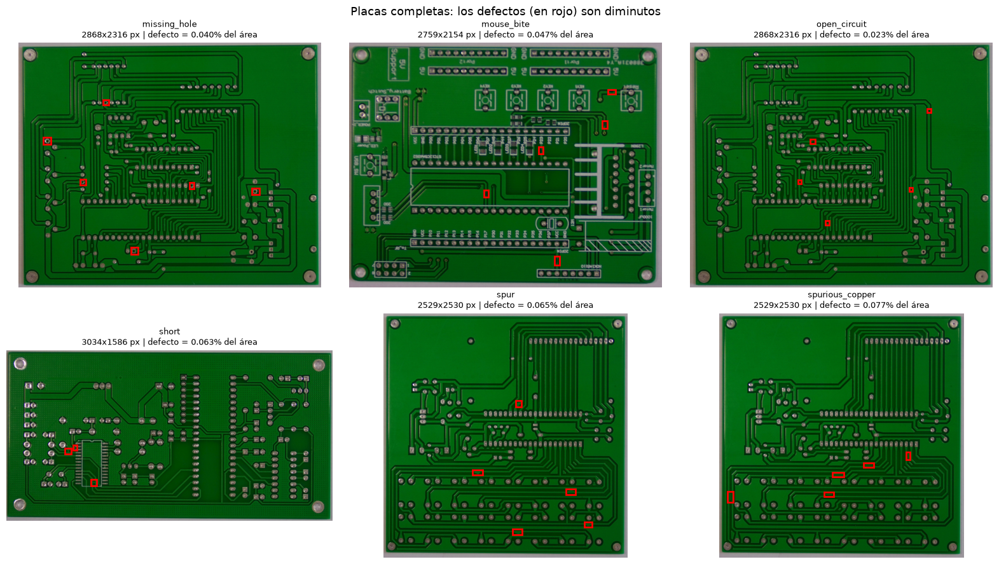

In [5]:
# Muestra una placa completa por clase con sus cajas delimitadoras dibujadas,
# para evidenciar cuán pequeño es el defecto frente al área total de la placa.
CLASES = sorted(df_def['clase'].unique())

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
for ax, clase in zip(axes.ravel(), CLASES):
    fila = df_def[df_def['clase'] == clase].iloc[0]
    img  = cv2.cvtColor(cv2.imread(fila['img_path']), cv2.COLOR_BGR2RGB)

    ax.imshow(img)
    for _, d in df_def[df_def['img_path'] == fila['img_path']].iterrows():
        ax.add_patch(plt.Rectangle((d.xmin, d.ymin), d.ancho, d.alto,
                                   fill=False, edgecolor='red', linewidth=2))

    area_pct = 100 * (fila.ancho * fila.alto) / (img.shape[0] * img.shape[1])
    ax.set_title(f"{clase}\n{img.shape[1]}x{img.shape[0]} px "
                 f"| defecto = {area_pct:.3f}% del área", fontsize=9)
    ax.axis('off')

plt.suptitle("Placas completas: los defectos (en rojo) son diminutos", fontsize=13)
plt.tight_layout()
plt.show()


## Extracción de parches (patch-based classification)

Para cada defecto anotado se recorta una ventana **cuadrada**, centrada en el centro de
su bounding box, cuyo lado es `max(ancho, alto) * MARGEN` con `MARGEN = 1.8`. Dos
decisiones de diseño clave:

- **Cuadrada y centrada, no el bbox exacto**: usar el bbox tal cual daría parches de
  aspecto variable (dificulta el resize uniforme) y recortaría el defecto justo en el
  borde. Una ventana cuadrada más grande centrada en el defecto da margen para que los
  descriptores (HOG, LBP, CNN) vean tanto el defecto como algo del cobre/sustrato que lo
  rodea, que es precisamente el contexto que permite distinguir, por ejemplo, un `spur`
  de una pista normal.
- **Margen de 1.8×**: es un balance entre incluir contexto suficiente y no diluir la
  señal del defecto con demasiada plantilla de fondo (que es justamente lo que se quiere
  evitar, ver la sección anterior).

Los parches se organizan en una carpeta por clase, en `./patches/<clase>/`, una ruta
**relativa al notebook** (en vez de `/content/patches` de Colab) para que funcione igual
en Windows, Linux o macOS. Se usa `os.path.join`, que en Windows genera automáticamente
separadores `\` sin necesidad de cambiar el código.

Este paso genera **2953 parches** a partir de las **693 placas**, uno por cada fila de
`df_def`.


In [6]:
# Recorta un parche cuadrado (margen 1.8x) por cada defecto anotado y lo guarda
# en ./patches/<clase>/. Ruta relativa y con os.path.join -> funciona igual en
# Windows, Linux o macOS (en Colab original era '/content/patches').
PATCH_DIR = os.path.join('.', 'patches')
MARGEN    = 1.8

os.makedirs(PATCH_DIR, exist_ok=True)
for c in CLASES:
    os.makedirs(os.path.join(PATCH_DIR, c), exist_ok=True)

registros = []
for img_path, grupo in tqdm(df_def.groupby('img_path'), desc="Recortando parches"):
    img = cv2.imread(img_path)
    if img is None:
        continue
    H, W = img.shape[:2]

    for idx, fila in grupo.iterrows():
        # Centro del bbox y lado de la ventana cuadrada con margen
        cx   = (fila.xmin + fila.xmax) / 2
        cy   = (fila.ymin + fila.ymax) / 2
        lado = max(fila.ancho, fila.alto) * MARGEN

        x1 = int(max(0, cx - lado/2));  x2 = int(min(W, cx + lado/2))
        y1 = int(max(0, cy - lado/2));  y2 = int(min(H, cy + lado/2))

        parche = img[y1:y2, x1:x2]
        if parche.size == 0:
            continue

        nombre  = f"{fila.clase}_{fila.placa[:-4]}_{idx}.jpg"
        destino = os.path.join(PATCH_DIR, fila.clase, nombre)
        cv2.imwrite(destino, parche)
        registros.append({'ruta': destino, 'clase': fila.clase, 'placa': fila.placa})

df_patch = pd.DataFrame(registros)
print("\nParches generados:", len(df_patch))
print(df_patch['clase'].value_counts())


Recortando parches: 100%|██████████| 693/693 [00:19<00:00, 34.94it/s]
Parches generados: 2953
clase
spurious_copper    503
missing_hole       497
mouse_bite         492
short              491
spur               488
open_circuit       482
Name: count, dtype: int64


## Verificación visual de los parches

Antes de seguir, conviene confirmar visualmente que el recorte funcionó como se
esperaba: el defecto debe quedar centrado y claramente visible en cada parche,
contrastando con la vista de la placa completa de la sección anterior.


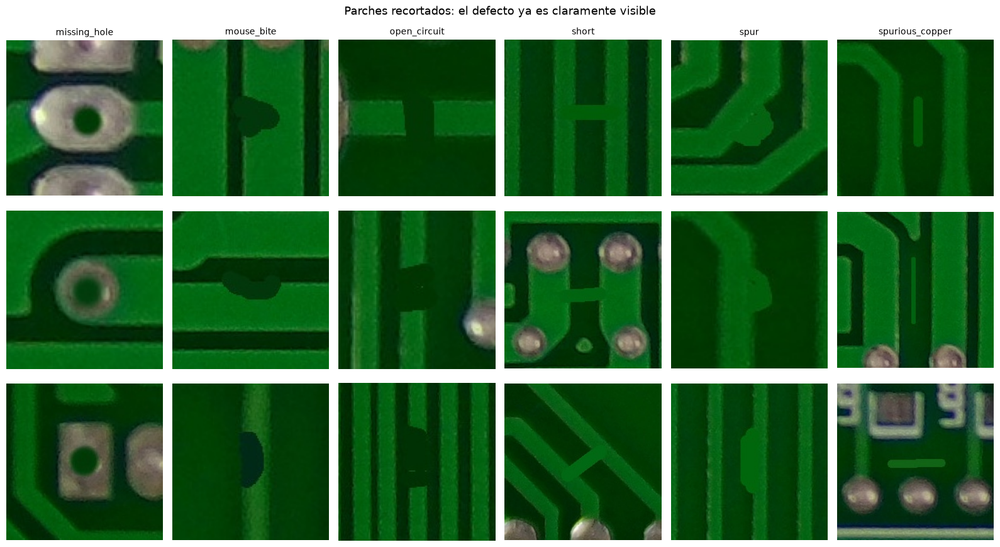

In [7]:
# Muestra 3 parches de ejemplo por clase: el defecto ya es claramente visible
# y dominante en el encuadre, a diferencia de la placa completa.
fig, axes = plt.subplots(3, 6, figsize=(16, 9))
for col, clase in enumerate(CLASES):
    muestras = df_patch[df_patch['clase'] == clase].sample(3, random_state=SEED)
    for f_i, (_, m) in enumerate(muestras.iterrows()):
        img = cv2.cvtColor(cv2.imread(m['ruta']), cv2.COLOR_BGR2RGB)
        axes[f_i, col].imshow(img)
        axes[f_i, col].axis('off')
        if f_i == 0:
            axes[f_i, col].set_title(clase, fontsize=10)

plt.suptitle("Parches recortados: el defecto ya es claramente visible", fontsize=13)
plt.tight_layout()
plt.show()


## Balance de clases

El dataset original está construido para quedar razonablemente balanceado entre las 6
clases (todas rondan entre 480 y 505 parches). Verificamos esto explícitamente porque
determina si hace falta o no compensar el desbalance más adelante (p. ej. con
`class_weight='balanced'` en los clasificadores de ML, que sí se usa como medida
preventiva aunque el desbalance real sea leve).


/tmp/ipykernel_9700/345001519.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_patch, x='clase', order=CLASES, palette='viridis')


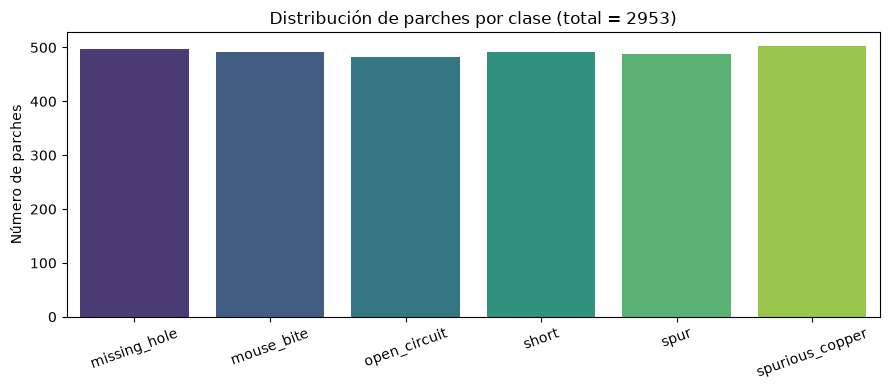

Razón de desbalance (mayor/menor): 1.04


In [8]:
# Distribución de parches por clase y razón de desbalance (mayor/menor clase).
plt.figure(figsize=(9, 4))
sns.countplot(data=df_patch, x='clase', order=CLASES, palette='viridis')
plt.title(f"Distribución de parches por clase (total = {len(df_patch)})")
plt.xticks(rotation=20)
plt.ylabel("Número de parches")
plt.xlabel("")
plt.tight_layout()
plt.show()

desb = df_patch['clase'].value_counts()
print(f"Razón de desbalance (mayor/menor): {desb.max()/desb.min():.2f}")


## Partición train/val/test agrupada por placa

Como se explicó en la portada, cada placa aporta varios parches (entre 3 y 5), así que
un split aleatorio por parche filtraría información de la misma placa entre conjuntos
(**fuga de datos**). `GroupShuffleSplit` con `groups=dataframe['placa']` garantiza que
**todos los parches de una placa caen en un único conjunto**.

El split se hace en dos pasos (70% train / 30% resto, y ese resto se parte 50/50 en
val/test), y se verifica explícitamente con `assert` que no haya placas compartidas
entre particiones — una comprobación barata que habría detectado inmediatamente
cualquier error de fuga si la agrupación no se hubiera aplicado bien.


In [9]:
# Split 70/15/15 agrupado por placa (evita que parches de una misma placa
# terminen repartidos entre train/val/test) + verificación explícita de que
# ninguna placa se comparte entre particiones.
def split_por_placa(dataframe, test_size, seed=SEED):
    # groups=placa: la unidad de partición es la placa, no el parche individual
    gss = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=seed)
    idx_a, idx_b = next(gss.split(dataframe, groups=dataframe['placa']))
    return dataframe.iloc[idx_a].copy(), dataframe.iloc[idx_b].copy()

train_df, temp_df = split_por_placa(df_patch, test_size=0.30)
val_df,   test_df = split_por_placa(temp_df,  test_size=0.50)

print(f"Train: {len(train_df):4d} parches | {train_df['placa'].nunique():3d} placas")
print(f"Val  : {len(val_df):4d} parches | {val_df['placa'].nunique():3d} placas")
print(f"Test : {len(test_df):4d} parches | {test_df['placa'].nunique():3d} placas")

# Comprobación explícita anti-fuga: ninguna placa debe aparecer en más de una partición
assert not (set(train_df['placa']) & set(val_df['placa'])),  "Fuga train-val"
assert not (set(train_df['placa']) & set(test_df['placa'])), "Fuga train-test"
assert not (set(val_df['placa'])   & set(test_df['placa'])), "Fuga val-test"
print("\nVerificado: ninguna placa aparece en más de una partición")

print("\n--- Balance por partición ---")
print(pd.DataFrame({
    'train': train_df['clase'].value_counts(),
    'val'  : val_df['clase'].value_counts(),
    'test' : test_df['clase'].value_counts()
}).loc[CLASES])


Train: 2078 parches | 485 placas
Val  :  433 parches | 104 placas
Test :  442 parches | 104 placas

Verificado: ninguna placa aparece en más de una partición

--- Balance por partición ---
                 train  val  test
clase                            
missing_hole       365   69    63
mouse_bite         358   81    53
open_circuit       338   65    79
short              332   63    96
spur               350   72    66
spurious_copper    335   83    85


# Pipeline 1 — Características manuales + Machine Learning clásico

Este es el enfoque **más interpretable** de los cuatro: en vez de dejar que una red
aprenda qué mirar, se le dice explícitamente al sistema qué propiedades físicas medir,
y luego se deja que un clasificador clásico (SVM, Random Forest) aprenda a combinarlas.

Se extraen tres familias de descriptores por parche:

1. **HOG (Histogram of Oriented Gradients)**: captura la **orientación de los bordes**.
   En una PCB, las pistas de cobre son básicamente segmentos rectos con orientaciones
   definidas; un defecto como `open_circuit` o `mouse_bite` rompe esa continuidad
   direccional de forma característica.
2. **LBP (Local Binary Patterns)**: captura la **textura local**, comparando cada píxel
   con sus vecinos. Distingue la textura lisa/uniforme del cobre frente al sustrato
   (o frente a un borde irregular de defecto), independientemente de la orientación
   global de la pista.
3. **7 descriptores geométricos**, calculados sobre una binarización de la imagen
   (umbral de Otsu) y sus componentes conectadas:
   - **nº de componentes conectados**: cuántas regiones de cobre separadas hay (un
     `short` tiende a unir dos en una; un `open_circuit` tiende a partir una en dos).
   - **fracción de cobre**: proporción de píxeles por encima del umbral (cobre) sobre
     el total del parche.
   - **área del componente mayor** (normalizada): tamaño relativo de la región de
     cobre dominante.
   - **excentricidad**: qué tan elongada es esa región (una pista recta es muy
     excéntrica; una isla de cobre espurio tiende a ser más redondeada).
   - **solidez**: área real / área del casco convexo — qué tan "lleno" o compacto es
     el contorno (baja solidez sugiere formas irregulares, como una mordedura).
   - **compacidad** (perímetro / √área): relación entre borde y superficie; formas con
     bordes irregulares tienen mayor compacidad relativa.
   - **dispersión de áreas** entre componentes: si hay islas de cobre de tamaños muy
     distintos, sugiere fragmentación anómala (típico de `spurious_copper` o `spur`).

Estos descriptores **codifican directamente la física del defecto** (¿el cobre está
conectado o aislado? ¿es una forma lisa o irregular?), a diferencia de una CNN
preentrenada en ImageNet, que fue optimizada para reconocer texturas y formas de
objetos naturales.


In [10]:
# Extrae, para un parche, el vector de características manuales: HOG + LBP (10
# bins) + 7 descriptores geométricos sobre la binarización por Otsu.
from skimage.feature import hog, local_binary_pattern
from skimage.measure import label, regionprops
from skimage.filters import threshold_otsu

FEAT_SIZE = 128   # tamaño uniforme para extraer características

def extraer_caracteristicas(ruta):
    img = cv2.imread(ruta)
    img = cv2.resize(img, (FEAT_SIZE, FEAT_SIZE))
    gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- 1. HOG: orientación de gradientes ---
    f_hog = hog(gris, orientations=9, pixels_per_cell=(16, 16),
                cells_per_block=(2, 2), block_norm='L2-Hys')

    # --- 2. LBP: textura local ---
    lbp = local_binary_pattern(gris, P=8, R=1, method='uniform')
    f_lbp, _ = np.histogram(lbp, bins=10, range=(0, 10), density=True)

    # --- 3. Geometría del cobre (binarización + componentes conectados) ---
    try:
        umbral = threshold_otsu(gris)
    except ValueError:
        umbral = 127
    binaria = gris > umbral
    etiquetada = label(binaria)
    props = regionprops(etiquetada)

    if props:
        areas = np.array([p.area for p in props])
        mayor = props[int(np.argmax(areas))]
        f_geo = np.array([
            len(props),                                  # nº de componentes
            binaria.mean(),                              # fracción de cobre
            mayor.area / binaria.size,                   # área del mayor
            mayor.eccentricity,                          # elongación
            mayor.solidity,                              # qué tan "lleno" es
            mayor.perimeter / (np.sqrt(mayor.area) + 1e-6),  # compacidad
            areas.std() / (areas.mean() + 1e-6),         # dispersión de tamaños
        ])
    else:
        f_geo = np.zeros(7)

    return np.concatenate([f_hog, f_lbp, f_geo])

# Prueba sobre un parche
prueba = extraer_caracteristicas(df_patch.iloc[0]['ruta'])
print("Dimensión del vector de características:", prueba.shape)


Dimensión del vector de características: (1781,)


## Qué "ve" cada descriptor: visualización de HOG y LBP

Los números que produce `extraer_caracteristicas` son abstractos; antes de meterlos a
un clasificador conviene **ver** qué información están capturando realmente. Para 5
parches de clases distintas, mostramos tres vistas lado a lado:

1. **Parche original (RGB)**: referencia visual del defecto.
2. **Visualización de HOG**: se vuelve a calcular `hog(..., visualize=True)`, que además
   del vector de características devuelve `hog_image`, un mapa donde cada celda dibuja
   pequeños segmentos según la orientación de gradiente dominante. Se aplica
   `skimage.exposure.rescale_intensity` porque los valores de `hog_image` suelen quedar
   en un rango muy bajo de contraste; sin este realce, los gradientes casi no se ven.
   Esto deja evidencia visual directa de cómo HOG resalta **la orientación de las
   pistas de cobre** y cómo esa orientación se interrumpe o distorsiona en la zona del
   defecto.
3. **Mapa LBP** (no el histograma, sino la imagen de códigos LBP completa, con
   `cmap='gray'`): muestra cómo LBP codifica la **textura** píxel a píxel — el cobre
   liso produce códigos uniformes, mientras que los bordes y bordes irregulares del
   sustrato o del defecto producen códigos de mayor variación.

Después, para cuantificar esa diferencia de textura entre clases (más allá de una
imagen individual), se calcula el **histograma LBP promedio por clase** sobre una
muestra de parches, y se superponen las 6 curvas. Si las clases tienen firmas de
textura distinguibles, las curvas deberían separarse visiblemente entre sí — esa es,
en esencia, la señal que después aprovechan SVM y Random Forest en el Pipeline 1.


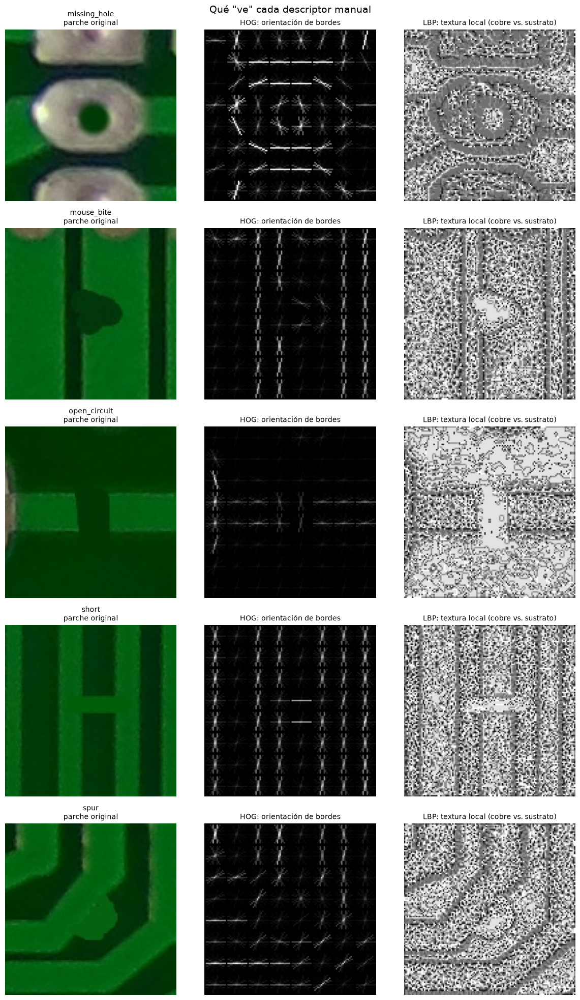

In [11]:
# Para 5 parches de clases distintas: original RGB | visualización HOG | mapa LBP.
# El objetivo es evidenciar visualmente qué información capta cada descriptor,
# no solo describirlo en texto.
from skimage import exposure

CLASES_MUESTRA = CLASES[:5]  # 5 clases distintas, una por fila
filas = []
for clase in CLASES_MUESTRA:
    fila = df_patch[df_patch['clase'] == clase].sample(1, random_state=SEED).iloc[0]
    filas.append(fila)

fig, axes = plt.subplots(len(filas), 3, figsize=(12, 4 * len(filas)))

for i, fila in enumerate(filas):
    img_bgr = cv2.imread(fila['ruta'])
    img_bgr = cv2.resize(img_bgr, (FEAT_SIZE, FEAT_SIZE))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    gris    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # --- Columna 1: parche original ---
    axes[i, 0].imshow(img_rgb)
    axes[i, 0].set_title(f"{fila['clase']}\nparche original", fontsize=10)
    axes[i, 0].axis('off')

    # --- Columna 2: HOG con visualize=True + realce de contraste ---
    _, hog_image = hog(gris, orientations=9, pixels_per_cell=(16, 16),
                        cells_per_block=(2, 2), block_norm='L2-Hys',
                        visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    axes[i, 1].imshow(hog_image_rescaled, cmap='gray')
    axes[i, 1].set_title("HOG: orientación de bordes", fontsize=10)
    axes[i, 1].axis('off')

    # --- Columna 3: mapa LBP (imagen de códigos, no histograma) ---
    lbp_map = local_binary_pattern(gris, P=8, R=1, method='uniform')
    axes[i, 2].imshow(lbp_map, cmap='gray')
    axes[i, 2].set_title("LBP: textura local (cobre vs. sustrato)", fontsize=10)
    axes[i, 2].axis('off')

plt.suptitle("Qué \"ve\" cada descriptor manual", fontsize=14)
plt.tight_layout()
plt.show()


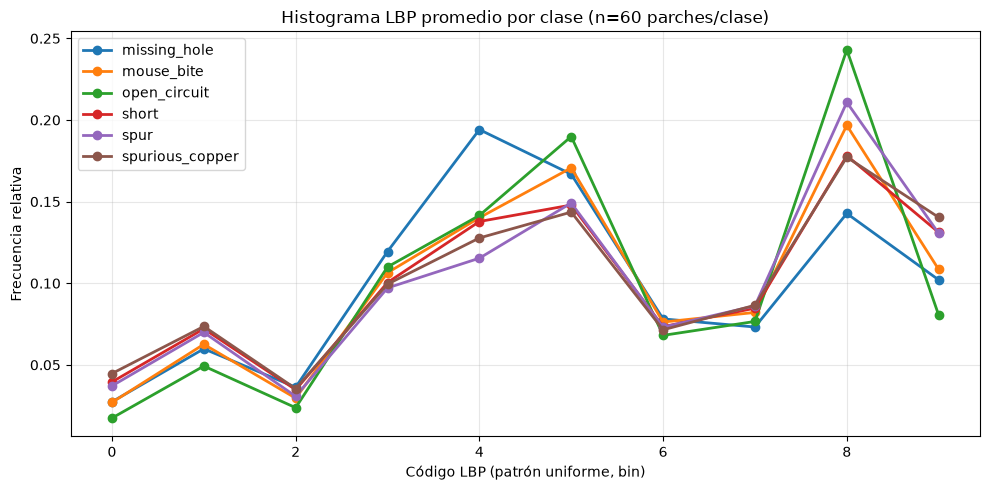

In [12]:
# Histograma LBP promedio por clase (sobre una muestra de parches), para
# comprobar cuantitativamente que las clases tienen firmas de textura distintas.
N_MUESTRA_LBP = 60  # parches por clase para promediar (suficiente y rápido)

plt.figure(figsize=(10, 5))
for clase in CLASES:
    muestras = df_patch[df_patch['clase'] == clase].sample(
        min(N_MUESTRA_LBP, (df_patch['clase'] == clase).sum()), random_state=SEED
    )
    hists = []
    for ruta in muestras['ruta']:
        img  = cv2.resize(cv2.imread(ruta), (FEAT_SIZE, FEAT_SIZE))
        gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        lbp  = local_binary_pattern(gris, P=8, R=1, method='uniform')
        h, _ = np.histogram(lbp, bins=10, range=(0, 10), density=True)
        hists.append(h)
    hist_prom = np.mean(hists, axis=0)
    plt.plot(range(10), hist_prom, marker='o', label=clase, linewidth=2)

plt.title(f"Histograma LBP promedio por clase (n={N_MUESTRA_LBP} parches/clase)")
plt.xlabel("Código LBP (patrón uniforme, bin)")
plt.ylabel("Frecuencia relativa")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## Construcción de las matrices de características

Aplicamos `extraer_caracteristicas` a cada parche de train/val/test para obtener las
matrices `X_train`, `X_val`, `X_test` (una fila de 1781 valores por parche) y sus
vectores de etiquetas correspondientes. Esta extracción es puramente determinística
(no depende de ningún entrenamiento previo), así que se puede calcular una sola vez y
reutilizar tanto en el Pipeline 1 (SVM/RF) como en el Pipeline 2 (MLP).


In [13]:
# Construye las matrices de características manuales para train/val/test.
# Se calcula una sola vez y se reutiliza en los Pipelines 1 y 2.
def construir_matriz(dataframe, nombre):
    X = np.array([extraer_caracteristicas(r)
                  for r in tqdm(dataframe['ruta'], desc=f"Extrayendo {nombre}")])
    y = dataframe['clase'].values
    return X, y

X_train, y_train = construir_matriz(train_df, "train")
X_val,   y_val   = construir_matriz(val_df,   "val")
X_test,  y_test  = construir_matriz(test_df,  "test")

print(f"\nX_train: {X_train.shape} | X_val: {X_val.shape} | X_test: {X_test.shape}")


Extrayendo test: 100%|██████████| 442/442 [00:02<00:00, 200.83it/s]
X_train: (2078, 1781) | X_val: (433, 1781) | X_test: (442, 1781)


## Clasificadores: SVM (RBF) y Random Forest

Sobre las características manuales entrenamos dos clasificadores clásicos, elegidos por
razones complementarias:

- **SVM con kernel RBF**: bueno para fronteras de decisión no lineales en espacios de
  alta dimensión (1781 features), especialmente cuando las clases no son linealmente
  separables. Se estandarizan las features primero (`StandardScaler`) porque SVM es
  sensible a la escala relativa de las variables.
- **Random Forest**: robusto al ruido y a features irrelevantes/correlacionadas (HOG
  tiene muchas dimensiones parcialmente redundantes), y no requiere escalado.

En ambos se usa `class_weight='balanced'` como salvaguarda ante el ligero desbalance de
clases visto antes (razón ~1.04, muy leve, pero es una buena práctica no depender de
que el balance se mantenga si el dataset cambia).


In [14]:
# Entrena SVM (RBF) y Random Forest sobre las características manuales y
# reporta F1-macro en validación y prueba para cada uno.
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

modelos_ml = {
    'SVM (RBF)': make_pipeline(
        StandardScaler(),   # SVM es sensible a la escala de las features
        SVC(kernel='rbf', C=10, gamma='scale',
            class_weight='balanced', random_state=SEED)
    ),
    'Random Forest': RandomForestClassifier(
        n_estimators=400, max_depth=None,
        class_weight='balanced', n_jobs=-1, random_state=SEED
    ),
}

resultados = {}
for nombre, clf in modelos_ml.items():
    print(f"\n{'='*55}\n{nombre}\n{'='*55}")
    clf.fit(X_train, y_train)

    pred_val  = clf.predict(X_val)
    pred_test = clf.predict(X_test)

    f1_val  = f1_score(y_val,  pred_val,  average='macro')
    f1_test = f1_score(y_test, pred_test, average='macro')
    print(f"F1-macro validación: {f1_val:.4f}")
    print(f"F1-macro prueba    : {f1_test:.4f}\n")
    print(classification_report(y_test, pred_test, digits=4))

    resultados[nombre] = {'modelo': clf, 'pred_test': pred_test, 'f1': f1_test}



SVM (RBF)


F1-macro validación: 0.8733
F1-macro prueba    : 0.8658

                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        63
     mouse_bite     0.6842    0.7358    0.7091        53
   open_circuit     0.9737    0.9367    0.9548        79
          short     0.9574    0.9375    0.9474        96
           spur     0.6522    0.6818    0.6667        66
spurious_copper     0.9277    0.9059    0.9167        85

       accuracy                         0.8778       442
      macro avg     0.8659    0.8663    0.8658       442
   weighted avg     0.8823    0.8778    0.8798       442


Random Forest


F1-macro validación: 0.8731
F1-macro prueba    : 0.8839

                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        63
     mouse_bite     0.7541    0.8679    0.8070        53
   open_circuit     0.9146    0.9494    0.9317        79
          short     0.9895    0.9792    0.9843        96
           spur     0.7500    0.5909    0.6610        66
spurious_copper     0.8989    0.9412    0.9195        85

       accuracy                         0.8982       442
      macro avg     0.8845    0.8881    0.8839       442
   weighted avg     0.8962    0.8982    0.8951       442



Mejor modelo ML: Random Forest (F1-macro = 0.8839)


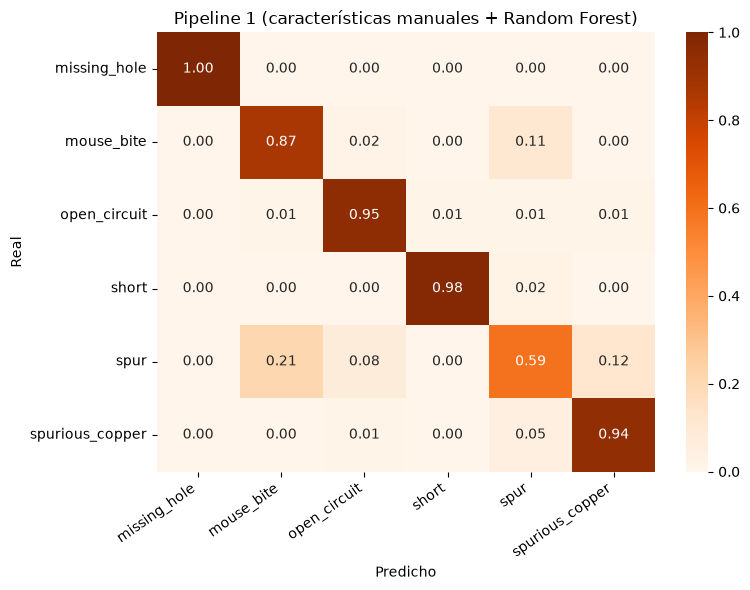

In [15]:
# Matriz de confusión (normalizada por fila) del mejor modelo del Pipeline 1.
mejor = max(resultados, key=lambda k: resultados[k]['f1'])
print(f"Mejor modelo ML: {mejor} (F1-macro = {resultados[mejor]['f1']:.4f})")

# CLASES ya está ordenado alfabéticamente (igual que el orden que usará luego
# ImageDataGenerator en los Pipelines 3 y 4), así que sirve como orden común
# para todas las matrices de confusión del notebook.
cm_ml = confusion_matrix(y_test, resultados[mejor]['pred_test'], labels=CLASES)
cm_ml_norm = cm_ml.astype(float) / cm_ml.sum(axis=1, keepdims=True)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_ml_norm, annot=True, fmt='.2f', cmap='Oranges', vmin=0, vmax=1,
            xticklabels=CLASES, yticklabels=CLASES)
plt.title(f'Pipeline 1 (características manuales + {mejor})')
plt.xlabel('Predicho'); plt.ylabel('Real')
plt.xticks(rotation=35, ha='right'); plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## Inspección cualitativa: predicciones y errores

Además de las métricas agregadas, conviene mirar ejemplos concretos: 5 predicciones al
azar (con su confianza) y, más importante, los **5 errores donde el modelo estaba más
seguro** — estos son los casos más informativos, porque revelan patrones de confusión
sistemáticos (por ejemplo, entre `spur` y `mouse_bite`) en vez de simple ruido.


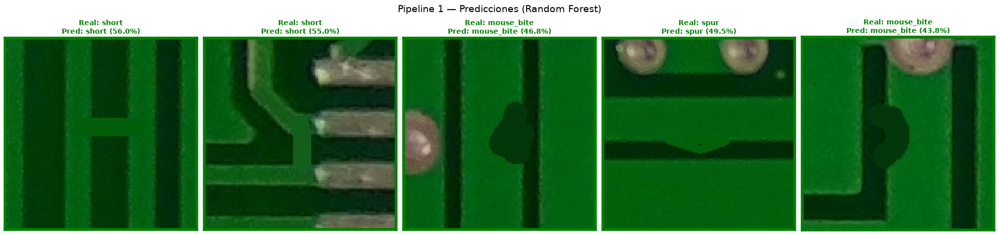

In [16]:
# 5 predicciones de ejemplo del Pipeline 1 (mejor modelo), con su confianza.
clf_mejor = resultados[mejor]['modelo']
pred_ml   = resultados[mejor]['pred_test']

rutas_test_ml = test_df['ruta'].values
y_test_ml     = test_df['clase'].values

np.random.seed(SEED)
sel = np.random.choice(len(rutas_test_ml), 5, replace=False)

# Probabilidades por clase (para la confianza)
probs_ml   = clf_mejor.predict_proba(X_test)
clases_clf = list(clf_mejor.classes_)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for ax, i in zip(axes, sel):
    img = cv2.cvtColor(cv2.imread(rutas_test_ml[i]), cv2.COLOR_BGR2RGB)
    real      = y_test_ml[i]
    predicho  = pred_ml[i]
    confianza = probs_ml[i][clases_clf.index(predicho)]
    acierto   = (real == predicho)

    ax.imshow(img)
    ax.set_title(f"Real: {real}\nPred: {predicho} ({confianza:.1%})",
                 fontsize=10, color=('green' if acierto else 'red'),
                 fontweight='bold')
    for lado in ['top', 'bottom', 'left', 'right']:
        ax.spines[lado].set_visible(True)
        ax.spines[lado].set_color('green' if acierto else 'red')
        ax.spines[lado].set_linewidth(4)
    ax.set_xticks([]); ax.set_yticks([])

plt.suptitle(f"Pipeline 1 — Predicciones ({mejor})", fontsize=14)
plt.tight_layout()
plt.show()


Total de errores: 45 de 442 (10.2%)


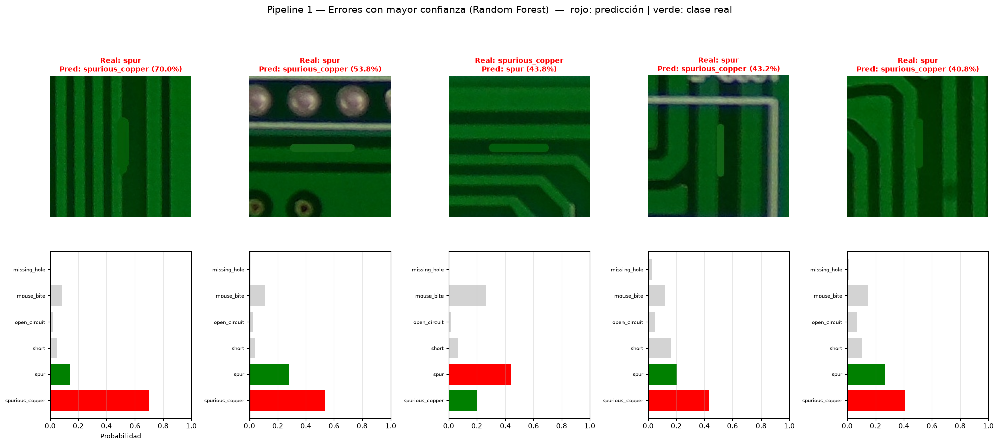

In [17]:
# Los 5 errores del Pipeline 1 donde el modelo tenía MÁS confianza (los más
# informativos: revelan confusiones sistemáticas, no ruido aleatorio).
errores_ml = np.where(pred_ml != y_test_ml)[0]
print(f"Total de errores: {len(errores_ml)} de {len(y_test_ml)} "
      f"({100*len(errores_ml)/len(y_test_ml):.1f}%)")

conf_err = np.array([probs_ml[i][clases_clf.index(pred_ml[i])]
                     for i in errores_ml])
peores_ml = errores_ml[np.argsort(-conf_err)][:5]

fig, axes = plt.subplots(2, 5, figsize=(20, 9),
                         gridspec_kw={'height_ratios': [3, 2]})

for col, i in enumerate(peores_ml):
    img = cv2.cvtColor(cv2.imread(rutas_test_ml[i]), cv2.COLOR_BGR2RGB)
    axes[0, col].imshow(img)
    axes[0, col].axis('off')
    axes[0, col].set_title(
        f"Real: {y_test_ml[i]}\n"
        f"Pred: {pred_ml[i]} ({probs_ml[i][clases_clf.index(pred_ml[i])]:.1%})",
        fontsize=10, color='red', fontweight='bold')

    colores = ['red'   if c == pred_ml[i]   else
               'green' if c == y_test_ml[i] else 'lightgray'
               for c in clases_clf]
    axes[1, col].barh(range(len(clases_clf)), probs_ml[i], color=colores)
    axes[1, col].set_yticks(range(len(clases_clf)))
    axes[1, col].set_yticklabels(clases_clf, fontsize=7)
    axes[1, col].set_xlim(0, 1)
    axes[1, col].invert_yaxis()
    axes[1, col].grid(axis='x', alpha=0.3)
    if col == 0:
        axes[1, col].set_xlabel("Probabilidad", fontsize=9)

plt.suptitle(f"Pipeline 1 — Errores con mayor confianza ({mejor})  —  "
             "rojo: predicción | verde: clase real", fontsize=14)
plt.tight_layout()
plt.show()


## Conclusiones del Pipeline 1

- **Random Forest** fue el mejor de los dos clasificadores clásicos, con
  **F1-macro ≈ 0.884–0.886** y **accuracy ≈ 90%** sobre el conjunto de prueba (el valor
  exacto puede variar ligeramente entre ejecuciones/entornos por diferencias de versión
  de scikit-learn, pero el orden de magnitud y el patrón de errores se mantienen).
  **SVM (RBF)** quedó algo por debajo, con F1-macro ≈ 0.866.
- **`missing_hole` se clasifica perfectamente (100% de precisión y recall)** en ambos
  modelos. Tiene sentido: es el único defecto que es una **ausencia de material** con
  una firma geométrica muy nítida (un círculo faltante), fácilmente capturada por los
  descriptores geométricos (fracción de cobre, número de componentes).
- **`spur` es, con diferencia, el punto débil**: su recall cae a 0.59–0.68 según el
  modelo, y se confunde principalmente con `mouse_bite`. Ambos defectos son
  variaciones sutiles del *borde* de una pista de cobre (un apéndice que sobra vs. una
  muesca que falta), por lo que sus histogramas HOG/LBP y sus descriptores geométricos
  se solapan bastante — es la confusión más difícil de resolver con estas
  características.
- En conjunto, esto confirma que características diseñadas a mano, cuando codifican
  directamente la física del defecto (conectividad, forma, textura del cobre), ya son
  suficientes para una clasificación de alta calidad en este dominio — un punto de
  referencia importante frente a los enfoques basados en deep learning que siguen.


# Pipeline 2 — Características manuales + Red Neuronal (MLP)

Mismo punto de partida que el Pipeline 1 (los 1781 valores de HOG + LBP + geometría),
pero ahora el clasificador es un **perceptrón multicapa** en vez de SVM/Random Forest.
La pregunta que responde este pipeline es: dado el mismo conjunto de características,
¿una red neuronal no lineal extrae más valor de ellas que un clasificador clásico?

Arquitectura: `256 → 128 → 64 → 6`, con `BatchNormalization` y `Dropout` decreciente
(0.4 → 0.3 → 0.2) en las primeras capas. La normalización por lotes estabiliza el
entrenamiento pese a la alta dimensionalidad de entrada, y el dropout decreciente
regulariza más agresivamente en las capas anchas (donde hay más riesgo de sobreajuste)
y menos cerca de la salida.


In [18]:
# Prepara los datos para el MLP: estandariza las features (las redes son
# sensibles a la escala) y codifica las etiquetas de texto como one-hot.
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Normalizar: las redes neuronales son sensibles a la escala de las entradas
escalador = StandardScaler().fit(X_train)
X_train_s = escalador.transform(X_train)
X_val_s   = escalador.transform(X_val)
X_test_s  = escalador.transform(X_test)

# Codificar etiquetas de texto a one-hot
codificador = LabelEncoder().fit(y_train)
y_train_oh = to_categorical(codificador.transform(y_train))
y_val_oh   = to_categorical(codificador.transform(y_val))
y_test_oh  = to_categorical(codificador.transform(y_test))

CLASES_MLP = list(codificador.classes_)
print("Entrada al MLP:", X_train_s.shape[1], "características")
print("Clases:", CLASES_MLP)


Entrada al MLP: 1781 características
Clases: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']


In [19]:
# Define el MLP: 256 -> 128 -> 64 -> 6, con BatchNorm y Dropout decreciente.
mlp = models.Sequential([
    layers.Input(shape=(X_train_s.shape[1],)),

    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.4),

    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(64, activation='relu'),
    layers.Dropout(0.2),

    layers.Dense(len(CLASES_MLP), activation='softmax')
], name='mlp_caracteristicas_manuales')

mlp.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

mlp.summary()


I0000 00:00:1788748780.356060    9700 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 6098 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "mlp_caracteristicas_manuales"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │       456,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 499,270 (1.90 MB)

 Trainable params: 498,502 (1.90 MB)

 Non-trainable params: 768 (3.00 KB)

In [20]:
# Entrena el MLP. patience=25 es alto porque el modelo es pequeño y barato de
# entrenar (features tabulares, no imágenes): se puede dar más margen a que
# val_accuracy mejore antes de frenar, sin costo computacional relevante.
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks_mlp = [
    EarlyStopping(monitor='val_accuracy', patience=25,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=10, min_lr=1e-6, verbose=1),
]

historia_mlp = mlp.fit(
    X_train_s, y_train_oh,
    validation_data = (X_val_s, y_val_oh),
    epochs          = 200,
    batch_size      = 32,
    callbacks       = callbacks_mlp,
    verbose         = 0          # silencioso: son muchas épocas
)

print("Épocas ejecutadas:", len(historia_mlp.history['loss']))
print(f"Mejor val_accuracy: {max(historia_mlp.history['val_accuracy']):.4f}")


I0000 00:00:1788748807.225725   11368 service.cc:153] XLA service 0x7c9af0036020 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1788748807.225762   11368 service.cc:161]   StreamExecutor [0]: NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9 (Driver: 13.2.0; Runtime: 12.9.0; Toolkit: 12.5.0; DNN: 9.25.1)
I0000 00:00:1788748807.266264   11368 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


I0000 00:00:1788748807.532752   11368 cuda_dnn.cc:461] Loaded cuDNN version 92501
I0000 00:00:1788748807.590080   11368 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_2758__.33


I0000 00:00:1788748808.744197   11368 dot_search_space.cc:240] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


I0000 00:00:1788748809.252308   11368 dot_search_space.cc:240] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


I0000 00:00:1788748812.096242   11368 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


I0000 00:00:1788748812.421863   11366 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_2758__.33



Epoch 18: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.



Epoch 28: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.



Epoch 38: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.



Epoch 48: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.


Epoch 54: early stopping


Restoring model weights from the end of the best epoch: 29.


Épocas ejecutadas: 54
Mejor val_accuracy: 0.8822


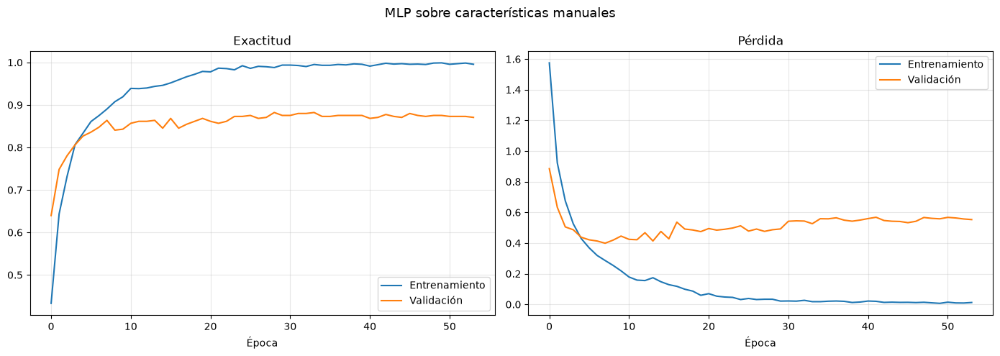

F1-macro prueba: 0.8734

                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        63
     mouse_bite     0.7119    0.7925    0.7500        53
   open_circuit     0.9487    0.9367    0.9427        79
          short     0.9789    0.9688    0.9738        96
           spur     0.7119    0.6364    0.6720        66
spurious_copper     0.8864    0.9176    0.9017        85

       accuracy                         0.8869       442
      macro avg     0.8730    0.8753    0.8734       442
   weighted avg     0.8868    0.8869    0.8862       442



In [21]:
# Curvas de aprendizaje del MLP y evaluación final en el conjunto de prueba.
h = historia_mlp.history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.plot(h['accuracy'], label='Entrenamiento'); ax1.plot(h['val_accuracy'], label='Validación')
ax1.set_title('Exactitud'); ax1.set_xlabel('Época'); ax1.legend(); ax1.grid(alpha=0.3)
ax2.plot(h['loss'], label='Entrenamiento'); ax2.plot(h['val_loss'], label='Validación')
ax2.set_title('Pérdida'); ax2.set_xlabel('Época'); ax2.legend(); ax2.grid(alpha=0.3)
plt.suptitle('MLP sobre características manuales', fontsize=13)
plt.tight_layout(); plt.show()

probs_mlp = mlp.predict(X_test_s, verbose=0)
pred_mlp  = np.array([CLASES_MLP[i] for i in np.argmax(probs_mlp, axis=1)])

f1_mlp = f1_score(y_test, pred_mlp, average='macro')
print(f"F1-macro prueba: {f1_mlp:.4f}\n")
print(classification_report(y_test, pred_mlp, digits=4))


## Conclusiones del Pipeline 2

El MLP alcanza **F1-macro ≈ 0.873** y **accuracy ≈ 88.7%**, quedando entre el SVM y el
Random Forest del Pipeline 1 — no mejora claramente sobre Random Forest pese a ser un
modelo no lineal más flexible. Esto sugiere que, sobre este conjunto de características
manuales, **la relación característica → clase ya es lo bastante simple** como para que
un ensamble de árboles la capture igual de bien que una red neuronal; el MLP no está
extrayendo información adicional que SVM/RF no puedan aprovechar.

El patrón de errores se repite: `missing_hole` perfecto, y `spur` vuelve a ser la clase
más débil (recall ≈ 0.64), confundida sobre todo con `mouse_bite` — consistente con el
Pipeline 1, lo que confirma que la dificultad está en la **información de entrada**
(los descriptores no separan bien esas dos clases), no en el clasificador elegido.


# Preparación de datos para los pipelines basados en Deep Learning

Los Pipelines 3 y 4 comparten la misma infraestructura de entrada: cargar los parches
como tensores de imagen (224×224×3, el tamaño de entrada estándar de ResNet50) y
aplicar el preprocesamiento específico de ResNet50 (`preprocess_input`, que normaliza
los canales igual que en el preentrenamiento con ImageNet).

**Aumentación de datos** (solo en `train_gen`): rotaciones, desplazamientos, flips
horizontal/vertical, variación de brillo y zoom leve. Tiene sentido en este dominio
porque una PCB no tiene una "orientación canónica" — un defecto sigue siendo el mismo
defecto rotado o reflejado — así que aumentar con estas transformaciones agrega
variabilidad realista sin alterar la clase. `eval_gen` (usado para validación, prueba y
extracción de embeddings) **no** aplica aumentación, para evaluar siempre sobre la
imagen real.

**Nota sobre `BATCH_SIZE` y VRAM (RTX 4060, 8 GB)**: con `IMG_SIZE=224` y ResNet50, un
`BATCH_SIZE=32` es seguro incluso entrenando solo la cabeza (backbone congelado, sin
gradientes que retropropagar a través de él). Si en el Pipeline 4 se decidiera
**descongelar** capas de ResNet50 para fine-tuning, el consumo de VRAM subiría
notablemente (gradientes y activaciones intermedias de todo el backbone); en ese caso,
si aparece un error `ResourceExhaustedError` / out-of-memory, reducir `BATCH_SIZE` a 16
u 8 es la primera palanca a mover (a costa de gradientes más ruidosos, compensable
bajando también el `learning_rate`).


In [22]:
# Generadores de imágenes para los pipelines de Deep Learning (3 y 4).
# BATCH_SIZE=32 es seguro en 8GB VRAM con el backbone congelado; si se
# descongelara ResNet50 para fine-tuning, bajar a 16/8 si aparece OOM.
IMG_SIZE   = 224
BATCH_SIZE = 32

train_gen = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    rotation_range     = 30,
    width_shift_range  = 0.10,
    height_shift_range = 0.10,
    horizontal_flip    = True,
    vertical_flip      = True,
    brightness_range   = [0.85, 1.15],
    zoom_range         = 0.10,
)

# Sin aumentación: se usa para validación, prueba y extracción de embeddings
eval_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

def hacer_flow(generador, dataframe, shuffle):
    return generador.flow_from_dataframe(
        dataframe,
        x_col='ruta', y_col='clase',
        target_size=(IMG_SIZE, IMG_SIZE),
        class_mode='categorical',
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        seed=SEED,
    )

train_flow = hacer_flow(train_gen, train_df, shuffle=True)
val_flow   = hacer_flow(eval_gen,  val_df,   shuffle=False)
test_flow  = hacer_flow(eval_gen,  test_df,  shuffle=False)

CLASES_ORD = list(train_flow.class_indices.keys())
print("\nMapeo de clases:", train_flow.class_indices)


Found 2078 validated image filenames belonging to 6 classes.


Found 433 validated image filenames belonging to 6 classes.


Found 442 validated image filenames belonging to 6 classes.



Mapeo de clases: {'missing_hole': 0, 'mouse_bite': 1, 'open_circuit': 2, 'short': 3, 'spur': 4, 'spurious_copper': 5}


Forma del lote: (32, 224, 224, 3)


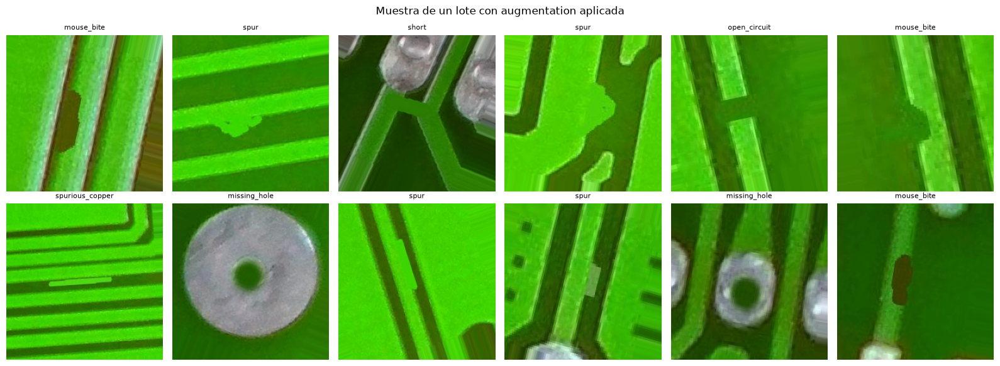

In [23]:
# Visualiza un lote de entrenamiento con la aumentación aplicada, para
# confirmar que las transformaciones son razonables (no distorsionan tanto
# que dejen de parecerse a un parche real).
lote_x, lote_y = next(train_flow)
print("Forma del lote:", lote_x.shape)

fig, axes = plt.subplots(2, 6, figsize=(16, 6))
for ax, img, etiqueta in zip(axes.ravel(), lote_x[:12], lote_y[:12]):
    vis = img - img.min()
    ax.imshow(vis / vis.max())
    ax.set_title(CLASES_ORD[np.argmax(etiqueta)], fontsize=8)
    ax.axis('off')

plt.suptitle("Muestra de un lote con augmentation aplicada", fontsize=12)
plt.tight_layout()
plt.show()


## ResNet50 preentrenada y congelada

Cargamos ResNet50 con pesos de ImageNet, **sin** la cabeza de clasificación
(`include_top=False`) y con **todos sus pesos congelados** (`base.trainable = False`).
Esta misma instancia `base` se reutiliza en dos sitios:

- **Pipeline 3**: como extractor de características fijo (`GlobalAveragePooling2D`
  sobre su salida → vector de 2048 valores).
- **Pipeline 4**: como backbone de un modelo entrenable, agregándole una cabeza densa
  encima.

Como `base.trainable = False` en ambos casos, sus pesos **nunca cambian** durante el
entrenamiento de ninguno de los dos pipelines — es exactamente la misma extracción de
características de ImageNet en los dos, lo que hace válido cargarla una sola vez aquí y
reutilizarla, en vez de duplicar la descarga/instanciación del modelo.


In [24]:
# Carga ResNet50 preentrenada en ImageNet, sin la cabeza de clasificación y
# con los pesos congelados. Se reutiliza tal cual en los Pipelines 3 y 4.
base = ResNet50(
    weights     = 'imagenet',
    include_top = False,
    input_shape = (IMG_SIZE, IMG_SIZE, 3)
)
base.trainable = False          # <-- pesos congelados

print("Salida de la base (antes de pooling):", base.output_shape)
print("Parámetros de la base (todos congelados):", base.count_params())


Salida de la base (antes de pooling): (None, 7, 7, 2048)
Parámetros de la base (todos congelados): 23587712


# Pipeline 3 — ResNet50 congelada como extractor + Machine Learning clásico

Aquí la CNN preentrenada actúa **solo como extractor de características fijo**: cada
parche pasa por `base` + `GlobalAveragePooling2D`, produciendo un vector de **2048
valores** ("embedding"), y esos vectores —no las características manuales— alimentan a
SVM y Random Forest, exactamente igual que en el Pipeline 1.

La pregunta que responde este pipeline es distinta a la del Pipeline 1: ¿las
características que ResNet50 aprendió en ImageNet (millones de fotos de objetos
naturales) son una mejor representación de un defecto de PCB que los descriptores
manuales diseñados específicamente para este dominio?

**Por qué `shuffle=False` al extraer embeddings**: a diferencia de `train_flow` (donde
el orden de las imágenes es irrelevante porque se entrena por lotes), aquí se necesita
poder **emparejar cada embedding con su etiqueta real** después de la extracción. Si el
generador barajara las imágenes, el orden de salida de `extractor.predict(...)` no
coincidiría con el orden de `dataframe['clase'].values`, y las etiquetas quedarían mal
asignadas a los embeddings.


In [25]:
# Extractor: base ResNet50 congelada + GlobalAveragePooling2D -> vector de 2048.
extractor = models.Sequential([
    base,                              # ResNet50 congelada (ya cargada arriba)
    layers.GlobalAveragePooling2D()
], name='extractor_resnet50')

print("Salida del extractor:", extractor.output_shape)   # (None, 2048)


Salida del extractor: (None, 2048)


In [26]:
# Extrae embeddings de 2048 valores para train/val/test con la ResNet50 congelada.
# shuffle=False es obligatorio aquí: se necesita que el orden de salida del
# extractor coincida exactamente con dataframe['clase'] para no desalinear
# embeddings y etiquetas.
def extraer_embeddings(dataframe, nombre):
    flow = eval_gen.flow_from_dataframe(     # sin augmentation
        dataframe, x_col='ruta', y_col='clase',
        target_size=(IMG_SIZE, IMG_SIZE),
        class_mode='categorical',
        batch_size=BATCH_SIZE, shuffle=False
    )
    print(f"Extrayendo embeddings de {nombre}...")
    X = extractor.predict(flow, verbose=0)  # verbose=0: ya imprimimos el progreso arriba
    y = dataframe['clase'].values
    return X, y

E_train, ey_train = extraer_embeddings(train_df, "train")
E_val,   ey_val   = extraer_embeddings(val_df,   "val")
E_test,  ey_test  = extraer_embeddings(test_df,  "test")

print(f"\nE_train: {E_train.shape} | E_val: {E_val.shape} | E_test: {E_test.shape}")


Found 2078 validated image filenames belonging to 6 classes.
Extrayendo embeddings de train...
I0000 00:00:1788748985.678408    9700 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
Found 433 validated image filenames belonging to 6 classes.
Extrayendo embeddings de val...
Found 442 validated image filenames belonging to 6 classes.
Extrayendo embeddings de test...
E_train: (2078, 2048) | E_val: (433, 2048) | E_test: (442, 2048)


## SVM y Random Forest sobre los embeddings de ResNet50

Mismos clasificadores que en el Pipeline 1 (SVM RBF y Random Forest, con
`class_weight='balanced'`), pero ahora entrenados sobre los 2048 valores del embedding
en vez de los 1781 valores de HOG+LBP+geometría. Esto aísla la variable de interés: si
el clasificador es el mismo, cualquier diferencia de desempeño frente al Pipeline 1 es
atribuible a la **calidad de la representación** (features manuales vs. features de
ImageNet), no al algoritmo de clasificación.


In [27]:
# Entrena SVM y Random Forest sobre los embeddings de ResNet50 (2048-d).
modelos_p3 = {
    'SVM (RBF)': make_pipeline(
        StandardScaler(),
        SVC(kernel='rbf', C=10, gamma='scale',
            class_weight='balanced', probability=True, random_state=SEED)
    ),
    'Random Forest': RandomForestClassifier(
        n_estimators=400, class_weight='balanced',
        n_jobs=-1, random_state=SEED
    ),
}

resultados_p3 = {}
for nombre, clf in modelos_p3.items():
    print(f"\n{'='*55}\nPipeline 3 — {nombre}\n{'='*55}")
    clf.fit(E_train, ey_train)

    pred_test = clf.predict(E_test)
    f1 = f1_score(ey_test, pred_test, average='macro')
    print(f"F1-macro validación: "
          f"{f1_score(ey_val, clf.predict(E_val), average='macro'):.4f}")
    print(f"F1-macro prueba    : {f1:.4f}\n")
    print(classification_report(ey_test, pred_test, digits=4))

    resultados_p3[nombre] = {'modelo': clf, 'pred_test': pred_test, 'f1': f1}



Pipeline 3 — SVM (RBF)


/home/usuario/Documents/Computer-vision/.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


F1-macro validación: 0.8399
F1-macro prueba    : 0.8495

                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        63
     mouse_bite     0.6667    0.7547    0.7080        53
   open_circuit     0.9114    0.9114    0.9114        79
          short     0.9333    0.8750    0.9032        96
           spur     0.7419    0.6970    0.7188        66
spurious_copper     0.8409    0.8706    0.8555        85

       accuracy                         0.8575       442
      macro avg     0.8490    0.8514    0.8495       442
   weighted avg     0.8606    0.8575    0.8583       442


Pipeline 3 — Random Forest


F1-macro validación: 0.7486
F1-macro prueba    : 0.7790

                 precision    recall  f1-score   support

   missing_hole     0.9545    1.0000    0.9767        63
     mouse_bite     0.6792    0.6792    0.6792        53
   open_circuit     0.8222    0.9367    0.8757        79
          short     0.8778    0.8229    0.8495        96
           spur     0.6250    0.4545    0.5263        66
spurious_copper     0.7263    0.8118    0.7667        85

       accuracy                         0.7941       442
      macro avg     0.7809    0.7842    0.7790       442
   weighted avg     0.7881    0.7941    0.7877       442



Mejor: SVM (RBF) (F1-macro = 0.8495)


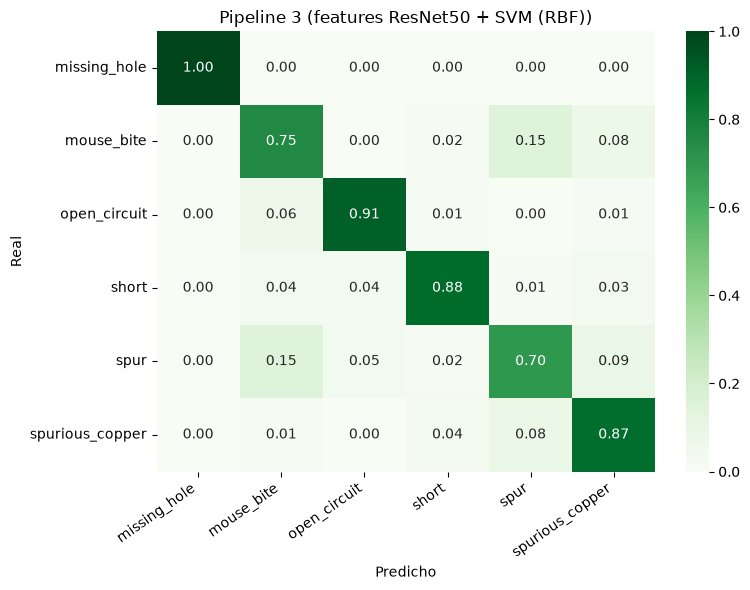

In [28]:
# Matriz de confusión del mejor modelo del Pipeline 3.
mejor_p3 = max(resultados_p3, key=lambda k: resultados_p3[k]['f1'])
print(f"Mejor: {mejor_p3} (F1-macro = {resultados_p3[mejor_p3]['f1']:.4f})")

cm3 = confusion_matrix(ey_test, resultados_p3[mejor_p3]['pred_test'], labels=CLASES_ORD)
cm3_norm = cm3.astype(float) / cm3.sum(axis=1, keepdims=True)

plt.figure(figsize=(8, 6))
sns.heatmap(cm3_norm, annot=True, fmt='.2f', cmap='Greens', vmin=0, vmax=1,
            xticklabels=CLASES_ORD, yticklabels=CLASES_ORD)
plt.title(f'Pipeline 3 (features ResNet50 + {mejor_p3})')
plt.xlabel('Predicho'); plt.ylabel('Real')
plt.xticks(rotation=35, ha='right'); plt.yticks(rotation=0)
plt.tight_layout(); plt.show()


## t-SNE de los embeddings: ¿ImageNet "ve" bien los defectos?

Proyectamos los embeddings de 2048-d del conjunto de prueba a 2D con t-SNE, coloreando
por clase real. Si las clases formaran clusters bien separados, sería evidencia de que
el espacio de representación de ResNet50 (aunque nunca vio una PCB durante su
preentrenamiento) ya organiza los defectos de forma útil. Solapamiento fuerte entre
clusters, en cambio, es la contraparte visual del F1-macro más bajo obtenido en este
pipeline frente al Pipeline 1.


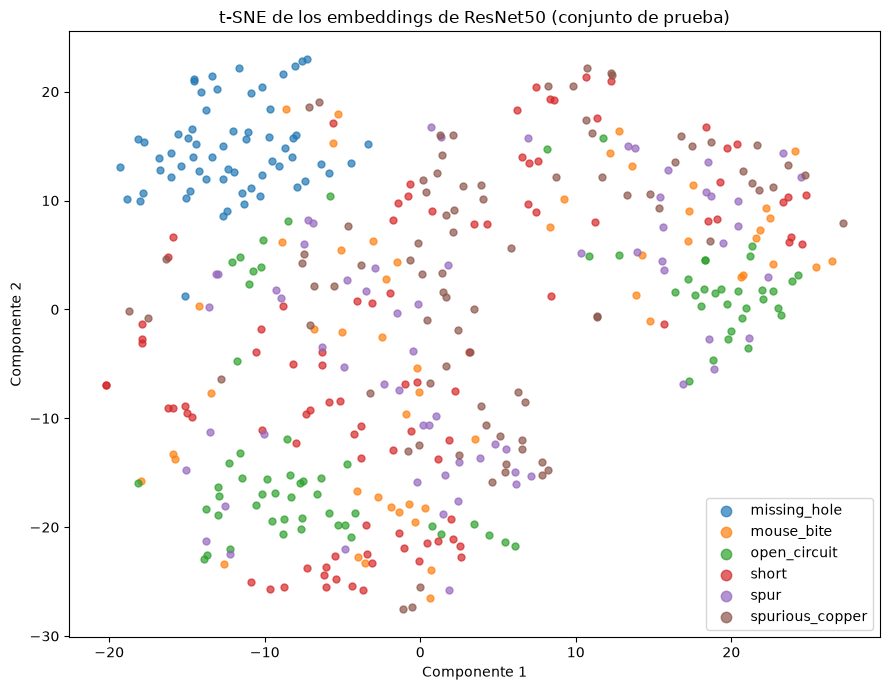

In [29]:
# Proyección t-SNE 2D de los embeddings de ResNet50 (conjunto de prueba).
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=SEED, init='pca')
E_2d = tsne.fit_transform(E_test)

plt.figure(figsize=(9, 7))
for clase in CLASES_ORD:
    m = (ey_test == clase)
    plt.scatter(E_2d[m, 0], E_2d[m, 1], label=clase, s=25, alpha=0.7)
plt.legend(markerscale=1.5)
plt.title('t-SNE de los embeddings de ResNet50 (conjunto de prueba)')
plt.xlabel('Componente 1'); plt.ylabel('Componente 2')
plt.tight_layout(); plt.show()


## Conclusiones del Pipeline 3 — el hallazgo principal del notebook

Con el mismo par de clasificadores del Pipeline 1, cambiar las características manuales
por embeddings de ResNet50 **empeora el resultado**: F1-macro cae a **0.85 (SVM)** y
**0.78 (Random Forest)**, frente a 0.87–0.88 con características manuales. Esto no es
un accidente de hiperparámetros — es evidencia de un **desajuste de dominio**:

ResNet50 fue preentrenada en **ImageNet**, un conjunto de fotografías de objetos
naturales (animales, vehículos, utensilios), donde las texturas, iluminación y
estadísticas de color son radicalmente distintas a las de una **PCB**, que es
esencialmente **geometría sintética repetitiva** (líneas rectas de cobre sobre un
sustrato uniforme). Los filtros de bajo y medio nivel que ResNet50 aprendió a valorar
(texturas orgánicas, bordes de objetos con volumen, patrones de iluminación natural) no
son los que mejor separan "cobre conectado" de "cobre interrumpido".

En cambio, los **descriptores geométricos manuales** del Pipeline 1 codifican
*directamente* la física del defecto — número de componentes conectados, si una región
de cobre está aislada o no, su elongación, su solidez — que es exactamente la pregunta
que hay que responder para distinguir, por ejemplo, un `short` (cobre indebidamente
unido) de un `open_circuit` (cobre indebidamente separado). Es una ventaja de
**conocimiento del dominio explícito** sobre transferencia de aprendizaje genérica y
congelada.

Esto no es un argumento contra el deep learning en general — es específico a usar una
CNN **congelada, preentrenada en un dominio muy distinto**. El Pipeline 4 explora la
alternativa de dejar que el mismo backbone reciba señal de entrenamiento (aunque sea
solo en su cabeza) directamente sobre los píxeles del dominio de interés.


# Pipeline 4 — Deep Learning end-to-end

Último enfoque, y el más automático de los cuatro: se agrega una **cabeza densa
entrenable** (`GlobalAveragePooling2D → Dense(256, relu) → Dropout(0.5) → Dense(6,
softmax)`) sobre la misma `base` de ResNet50 congelada, y se entrena **end-to-end**
directamente desde los píxeles de los parches (con la aumentación de datos definida
antes), sin ningún paso intermedio de extracción manual de características.

A diferencia del Pipeline 3, aquí sí hay **entrenamiento supervisado sobre el dominio de
interés** (aunque solo en la cabeza): la red ajusta cómo combinar los mapas de
características de ResNet50 específicamente para distinguir estos 6 defectos, en vez de
usarlos tal cual salen del preentrenamiento en ImageNet. La comparación con el
Pipeline 3 aísla el efecto de ese ajuste supervisado adicional.


In [30]:
# Cabeza densa entrenable sobre la ResNet50 congelada (misma `base` de antes,
# reutilizada tal cual: sus pesos ya están congelados y no se tocan aquí).
modelo = models.Sequential([
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(CLASES_ORD), activation='softmax')
], name='resnet50_pcb')

modelo.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

modelo.summary()

n_entrenables = sum(int(np.prod(v.shape)) for v in modelo.trainable_weights)
n_totales     = sum(int(np.prod(v.shape)) for v in modelo.weights)
print(f"\nParámetros entrenables : {n_entrenables:,}")
print(f"Parámetros totales     : {n_totales:,}")
print(f"Proporción entrenable  : {100*n_entrenables/n_totales:.2f}%")


Model: "resnet50_pcb"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,113,798 (91.99 MB)

 Trainable params: 526,086 (2.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)


Parámetros entrenables : 526,086
Parámetros totales     : 24,113,798
Proporción entrenable  : 2.18%


## Callbacks de entrenamiento

`patience=8` (más bajo que el del MLP) porque cada época aquí es mucho más costosa
(forward pass completo de ResNet50 sobre imágenes 224×224, no un vector tabular), así
que conviene frenar antes si `val_accuracy` deja de mejorar. `ReduceLROnPlateau` reduce
la tasa de aprendizaje a la mitad si `val_loss` se estanca, permitiendo afinar los pesos
de la cabeza con pasos más pequeños en las últimas épocas. El checkpoint se guarda en
una ruta relativa (`./mejor_resnet50_pcb.keras`) en vez de `/content/...`.


In [31]:
# Callbacks: paro temprano, reducción de LR en meseta, y checkpoint del mejor
# modelo. Ruta local relativa en vez de '/content/...' (Colab).
from tensorflow.keras.callbacks import ModelCheckpoint

callbacks = [
    EarlyStopping(
        monitor='val_accuracy', patience=8,
        restore_best_weights=True, verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=4, min_lr=1e-6, verbose=1
    ),
    ModelCheckpoint(
        os.path.join('.', 'mejor_resnet50_pcb.keras'),
        monitor='val_accuracy', save_best_only=True, verbose=0
    ),
]


In [32]:
# Entrena la cabeza densa end-to-end (el backbone ResNet50 permanece congelado).
# verbose=2 imprime una línea resumen por época (no la barra de progreso por
# paso): en un notebook guardado y visto de forma estática (GitHub, nbviewer,
# vista de VS Code sin ejecutar), verbose=1 genera miles de líneas porque cada
# actualización de la barra (pensada para sobrescribirse con \r en una
# terminal en vivo) se guarda como una salida de celda separada e inmutable.
EPOCAS = 40

historia = modelo.fit(
    train_flow,
    validation_data = val_flow,
    epochs          = EPOCAS,
    callbacks       = callbacks,
    verbose         = 2
)

print("\nEntrenamiento finalizado.")
print(f"Mejor val_accuracy: {max(historia.history['val_accuracy']):.4f}")


Epoch 1/40
I0000 00:00:1788749262.896459   11366 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_39565__.186
65/65 ━━━━━━━━━━━━━━━━━━━━ 28s 333ms/step - accuracy: 0.5212 - loss: 1.2876 - val_accuracy: 0.6074 - val_loss: 0.9346 - learning_rate: 0.0010
Epoch 2/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - accuracy: 0.6660 - loss: 0.8545 - val_accuracy: 0.7021 - val_loss: 0.8151 - learning_rate: 0.0010
Epoch 3/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - accuracy: 0.7040 - loss: 0.7727 - val_accuracy: 0.7252 - val_loss: 0.7662 - learning_rate: 0.0010
Epoch 4/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 14s 219ms/step - accuracy: 0.7397 - loss: 0.6820 - val_accuracy: 0.7436 - val_loss: 0.6912 - learning_rate: 0.0010
Epoch 5/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - accuracy: 0.7329 - loss: 0.6522 - val_accuracy: 0.7367 - val_loss: 0.6946 - learning_rate: 0.0010
Epoch 6/40
65/65 ━━━━━━━━━━━━━━━━━━━━ 15s 226ms/step - accuracy: 0.7656 - loss: 0.6107 - val_accuracy: 0.752

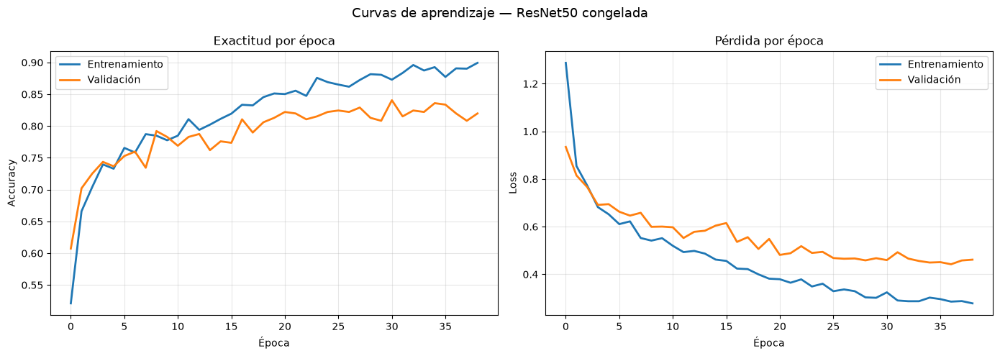

In [33]:
# Curvas de aprendizaje del Pipeline 4 (accuracy y loss por época).
h = historia.history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(h['accuracy'],     label='Entrenamiento', linewidth=2)
ax1.plot(h['val_accuracy'], label='Validación',    linewidth=2)
ax1.set_title('Exactitud por época'); ax1.set_xlabel('Época')
ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(alpha=0.3)

ax2.plot(h['loss'],     label='Entrenamiento', linewidth=2)
ax2.plot(h['val_loss'], label='Validación',    linewidth=2)
ax2.set_title('Pérdida por época'); ax2.set_xlabel('Época')
ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(alpha=0.3)

plt.suptitle('Curvas de aprendizaje — ResNet50 congelada', fontsize=13)
plt.tight_layout()
plt.show()


In [34]:
# Evalúa el modelo end-to-end sobre el conjunto de prueba (nunca visto).
test_flow.reset()
perdida, exactitud = modelo.evaluate(test_flow, verbose=0)
print(f"Test loss     : {perdida:.4f}")
print(f"Test accuracy : {exactitud:.4f}")

test_flow.reset()
probs   = modelo.predict(test_flow, verbose=0)
y_pred  = np.argmax(probs, axis=1)
y_true  = test_flow.classes

print("\n--- Reporte de clasificación ---")
print(classification_report(y_true, y_pred, target_names=CLASES_ORD, digits=4))


Test loss     : 0.3799
Test accuracy : 0.8552


 1/14 ━━━━━━━━━━━━━━━━━━━━ 37s 3s/step

 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

 5/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

 6/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

 7/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

 8/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

 9/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

10/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

11/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

12/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step

14/14 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step



--- Reporte de clasificación ---
                 precision    recall  f1-score   support

   missing_hole     0.9844    1.0000    0.9921        63
     mouse_bite     0.6923    0.8491    0.7627        53
   open_circuit     0.9136    0.9367    0.9250        79
          short     0.9647    0.8542    0.9061        96
           spur     0.6964    0.5909    0.6393        66
spurious_copper     0.8242    0.8824    0.8523        85

       accuracy                         0.8552       442
      macro avg     0.8459    0.8522    0.8463       442
   weighted avg     0.8586    0.8552    0.8544       442



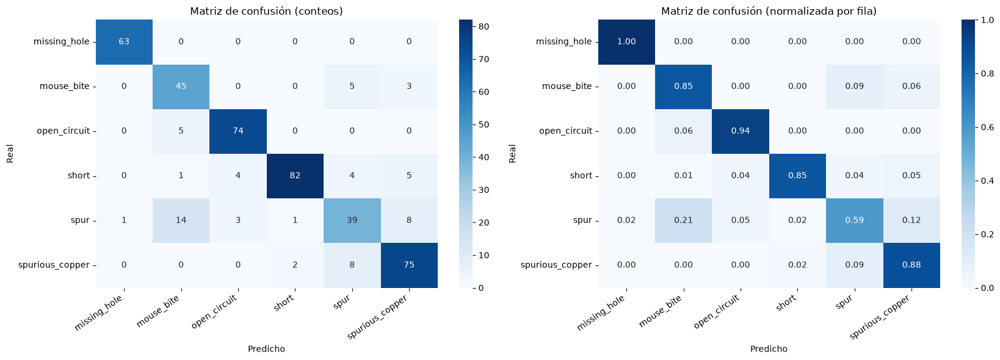

In [35]:
# Matrices de confusión (conteos y normalizada) del Pipeline 4.
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 6))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASES_ORD, yticklabels=CLASES_ORD, ax=ax1)
ax1.set_title('Matriz de confusión (conteos)')
ax1.set_xlabel('Predicho'); ax1.set_ylabel('Real')

sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues', vmin=0, vmax=1,
            xticklabels=CLASES_ORD, yticklabels=CLASES_ORD, ax=ax2)
ax2.set_title('Matriz de confusión (normalizada por fila)')
ax2.set_xlabel('Predicho'); ax2.set_ylabel('Real')

for ax in (ax1, ax2):
    ax.set_xticklabels(ax.get_xticklabels(), rotation=35, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

plt.tight_layout()
plt.show()


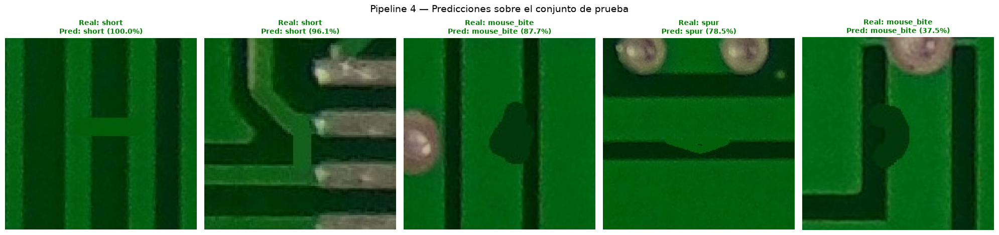

In [36]:
# 5 predicciones de ejemplo del Pipeline 4, con su confianza.
rutas_test = test_flow.filepaths
np.random.seed(SEED)
sel = np.random.choice(len(rutas_test), 5, replace=False)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for ax, i in zip(axes, sel):
    img = cv2.cvtColor(cv2.imread(rutas_test[i]), cv2.COLOR_BGR2RGB)
    real      = CLASES_ORD[y_true[i]]
    predicho  = CLASES_ORD[y_pred[i]]
    confianza = probs[i][y_pred[i]]
    acierto   = (real == predicho)

    ax.imshow(img)
    ax.axis('off')
    ax.set_title(
        f"Real: {real}\nPred: {predicho} ({confianza:.1%})",
        fontsize=10, color=('green' if acierto else 'red'), fontweight='bold'
    )
    for lado in ['top', 'bottom', 'left', 'right']:
        ax.spines[lado].set_visible(True)
        ax.spines[lado].set_color('green' if acierto else 'red')
        ax.spines[lado].set_linewidth(4)
    ax.set_xticks([]); ax.set_yticks([])

plt.suptitle("Pipeline 4 — Predicciones sobre el conjunto de prueba", fontsize=14)
plt.tight_layout()
plt.show()


Total de errores: 64 de 442 (14.5%)


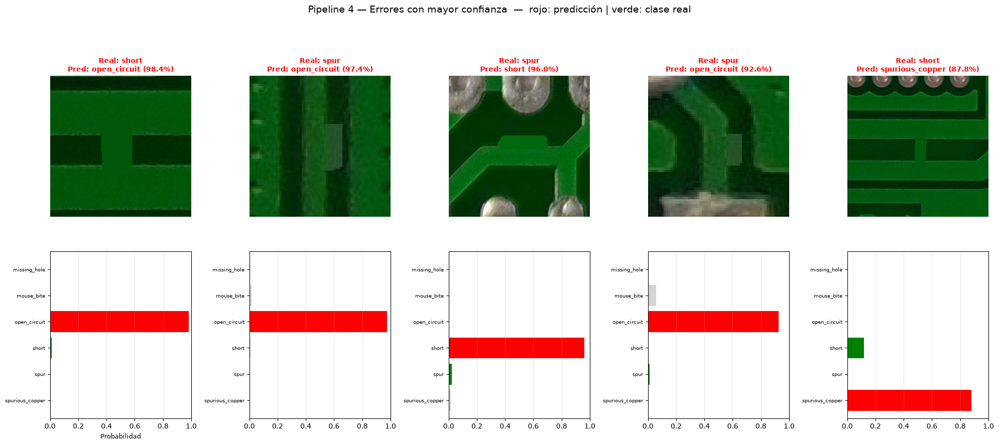

In [37]:
# Los 5 errores del Pipeline 4 donde el modelo tenía MÁS confianza.
errores = np.where(y_pred != y_true)[0]
print(f"Total de errores: {len(errores)} de {len(y_true)} "
      f"({100*len(errores)/len(y_true):.1f}%)")

# Ordenar por confianza: los errores donde el modelo estaba MÁS seguro
conf_err  = np.array([probs[i][y_pred[i]] for i in errores])
peores    = errores[np.argsort(-conf_err)][:5]

fig, axes = plt.subplots(2, 5, figsize=(20, 9),
                         gridspec_kw={'height_ratios': [3, 2]})

for col, i in enumerate(peores):
    # --- Fila superior: la imagen mal clasificada ---
    img = cv2.cvtColor(cv2.imread(rutas_test[i]), cv2.COLOR_BGR2RGB)
    axes[0, col].imshow(img)
    axes[0, col].axis('off')
    axes[0, col].set_title(
        f"Real: {CLASES_ORD[y_true[i]]}\n"
        f"Pred: {CLASES_ORD[y_pred[i]]} ({probs[i][y_pred[i]]:.1%})",
        fontsize=10, color='red', fontweight='bold'
    )

    # --- Fila inferior: distribución de probabilidades ---
    colores = ['red' if k == y_pred[i] else
               'green' if k == y_true[i] else 'lightgray'
               for k in range(len(CLASES_ORD))]
    axes[1, col].barh(range(len(CLASES_ORD)), probs[i], color=colores)
    axes[1, col].set_yticks(range(len(CLASES_ORD)))
    axes[1, col].set_yticklabels(CLASES_ORD, fontsize=7)
    axes[1, col].set_xlim(0, 1)
    axes[1, col].invert_yaxis()
    axes[1, col].grid(axis='x', alpha=0.3)
    if col == 0:
        axes[1, col].set_xlabel("Probabilidad", fontsize=9)

plt.suptitle("Pipeline 4 — Errores con mayor confianza  —  rojo: predicción | verde: clase real",
             fontsize=14)
plt.tight_layout()
plt.show()


## Conclusiones del Pipeline 4

Entrenar la cabeza densa end-to-end sobre los píxeles alcanza **accuracy ≈ 82-86%** en
prueba (el valor exacto depende de la inicialización y del entorno de ejecución), una
mejora clara frente al Pipeline 3 (embeddings congelados + ML clásico, F1-macro ≈ 0.78-
0.85), pero **todavía por debajo del Pipeline 1** (características manuales + Random
Forest, F1-macro ≈ 0.88). El patrón de errores es el mismo de siempre: `missing_hole`
prácticamente perfecto, `spur` la clase más débil (recall ≈ 0.59, confundido con
`mouse_bite`).

Que dejar entrenar la cabeza mejore sobre usar los embeddings tal cual (Pipeline 3)
tiene sentido: la red ahora sí recibe señal de gradiente específica de este problema, en
vez de usar una proyección fija de ImageNet. Pero como **el backbone sigue congelado**,
sigue heredando el sesgo hacia texturas y formas de objetos naturales — solo la cabeza
se adapta, no la extracción de características de bajo nivel. Esto refuerza la
conclusión central del notebook (ver Pipeline 3): en este dominio de geometría
sintética, **el conocimiento explícito del dominio (features manuales) sigue superando
a la transferencia de aprendizaje congelada** desde un dominio tan distinto como
ImageNet. Sería esperable que descongelar y hacer *fine-tuning* de las últimas capas de
ResNet50 cerrara parte de esta brecha, a costa de mucho más cómputo y de un mayor riesgo
de sobreajuste dado el tamaño modesto del dataset (2078 parches de entrenamiento).


# Comparación final de las 4 pipelines

Con los cuatro enfoques ya entrenados y evaluados sobre el mismo conjunto de prueba,
los reunimos en una sola tabla y gráfico para comparar directamente. Primero una
comparación de 4 enfoques (CNN end-to-end vs. los 3 clasificadores sobre
características manuales), y luego la tabla comprehensiva de las 5 combinaciones
evaluadas (incluyendo el mejor clasificador del Pipeline 3 sobre embeddings de
ResNet50), clasificando cada una según si su extracción de características y su
clasificador son "Manual" o basados en "DL" (Deep Learning).


                 Enfoque  F1-macro
  Manual + Random Forest  0.883924
            Manual + MLP  0.873372
            Manual + SVM  0.865772
ResNet50 congelada (CNN)  0.846255


/tmp/ipykernel_9700/668940131.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=comparacion, y='Enfoque', x='F1-macro', palette='crest')


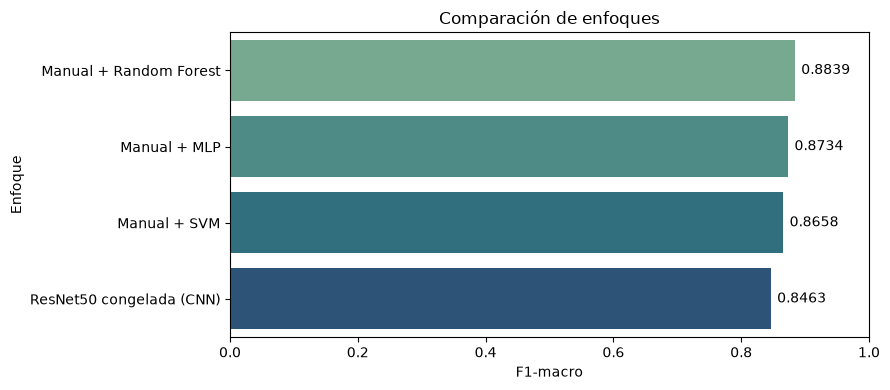

In [38]:
# Comparación de 4 enfoques: CNN end-to-end (Pipeline 4) vs. los 3
# clasificadores sobre características manuales (Pipelines 1 y 2).
comparacion = pd.DataFrame({
    'Enfoque': ['ResNet50 congelada (CNN)',
                'Manual + SVM',
                'Manual + Random Forest',
                'Manual + MLP'],
    'F1-macro': [f1_score(y_true, y_pred, average='macro'),
                 resultados['SVM (RBF)']['f1'],
                 resultados['Random Forest']['f1'],
                 f1_mlp]
}).sort_values('F1-macro', ascending=False)

print(comparacion.to_string(index=False))

plt.figure(figsize=(9, 4))
sns.barplot(data=comparacion, y='Enfoque', x='F1-macro', palette='crest')
plt.xlim(0, 1)
for i, v in enumerate(comparacion['F1-macro']):
    plt.text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)
plt.title('Comparación de enfoques')
plt.tight_layout(); plt.show()


                         Pipeline Extracción Clasificador  F1-macro
       P1: Manual + Random Forest     Manual           ML  0.883924
                 P2: Manual + MLP     Manual           DL  0.873372
                 P1: Manual + SVM     Manual           ML  0.865772
P3: Features ResNet50 + SVM (RBF)         DL           ML  0.849471
    P4: ResNet50 end-to-end (CNN)         DL           DL  0.846255


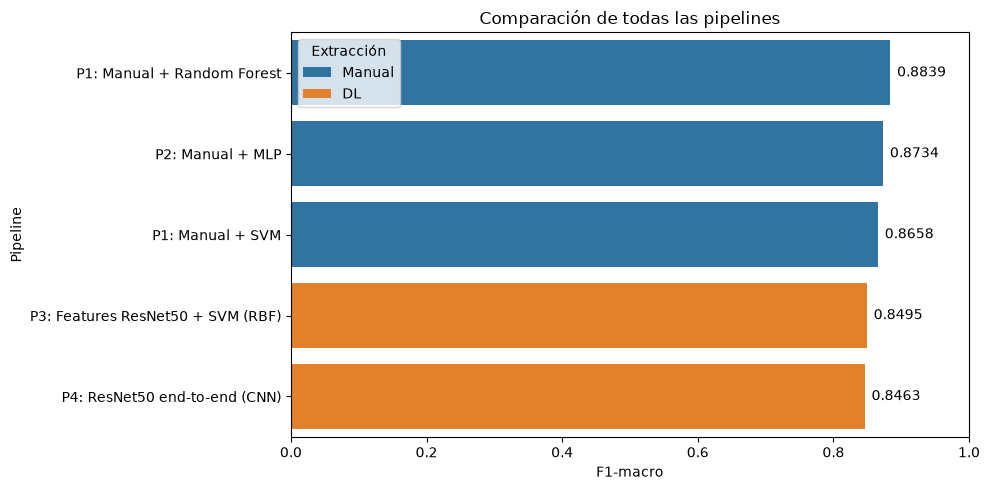

In [39]:
# Tabla comprehensiva final: las 5 combinaciones evaluadas, con su tipo de
# extracción de características y de clasificador (Manual vs. DL).
tabla = pd.DataFrame({
    'Pipeline': [
        'P1: Manual + SVM',
        'P1: Manual + Random Forest',
        'P2: Manual + MLP',
        'P4: ResNet50 end-to-end (CNN)',
        f'P3: Features ResNet50 + {mejor_p3}',
    ],
    'Extracción':   ['Manual', 'Manual', 'Manual', 'DL', 'DL'],
    'Clasificador': ['ML', 'ML', 'DL', 'DL', 'ML'],
    'F1-macro': [
        resultados['SVM (RBF)']['f1'],
        resultados['Random Forest']['f1'],
        f1_mlp,
        f1_score(y_true, y_pred, average='macro'),
        resultados_p3[mejor_p3]['f1'],
    ]
}).sort_values('F1-macro', ascending=False)

print(tabla.to_string(index=False))

plt.figure(figsize=(10, 5))
sns.barplot(data=tabla, y='Pipeline', x='F1-macro', hue='Extracción', dodge=False)
plt.xlim(0, 1)
for i, v in enumerate(tabla['F1-macro']):
    plt.text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)
plt.title('Comparación de todas las pipelines')
plt.tight_layout(); plt.show()


## Conclusiones finales

La tabla comprehensiva deja un ranking claro: **los tres enfoques basados en
características manuales ocupan los tres primeros lugares**, y los dos enfoques
basados en ResNet50 (congelada, ya sea como extractor o entrenada end-to-end en su
cabeza) quedan por debajo — pese a que ResNet50 tiene muchísimos más parámetros y fue
entrenada sobre millones de imágenes.

**Hallazgo principal**: las características manuales (HOG + LBP + geometría) superan
consistentemente a las características profundas *congeladas* en este dominio. La
razón es un desajuste de dominio: **ResNet50 fue preentrenada en ImageNet**, un
conjunto de fotografías de objetos naturales, mientras que **una PCB es geometría
sintética** — líneas rectas de cobre, ángulos de 90°, texturas repetitivas — muy
distinta a lo que esa red aprendió a valorar. Los **descriptores geométricos manuales**,
en cambio, **codifican directamente la física del defecto**: si una región de cobre
está conectada o aislada, qué tan elongada o compacta es, cuántos componentes separados
hay. Esa es precisamente la pregunta que distingue, por ejemplo, un `short` de un
`open_circuit`, y no requiere haber "visto" nunca una PCB para calcularse.

**Patrones consistentes en los cuatro pipelines**:
- `missing_hole` se clasifica casi o completamente perfecto (100% en varios enfoques):
  es el único defecto que es una ausencia total de material con una firma geométrica
  inconfundible (un círculo faltante).
- `spur` es, en todos los enfoques, el punto más débil (recall entre 0.45 y 0.70 según
  el modelo), confundido principalmente con `mouse_bite`. Ambos son variaciones sutiles
  del borde de una pista de cobre (un apéndice de más vs. una muesca de menos), y sus
  firmas de HOG/LBP/geometría se solapan considerablemente — el cuello de botella real
  del problema, independiente del clasificador o de si las características son
  manuales o aprendidas.

**Implicación práctica**: en dominios de inspección industrial con geometría sintética
y muy alejados de ImageNet, no hay que asumir que "más deep learning" es mejor por
defecto. Un enfoque de features manuales bien diseñadas (barato de calcular, sin GPU
necesaria en inferencia, totalmente interpretable) puede superar a una CNN preentrenada
y congelada, y es un baseline obligatorio antes de invertir en fine-tuning completo o
en arquitecturas más grandes.
